<a href="https://colab.research.google.com/github/ONIgbokwe/MyProjects/blob/master/Customer_Churn_Prediction_Iteration2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Customer Churn Prediction



##### **Project Type**    - Classification
##### **Contribution**    - Group 3


# **Problem Statement**


The objective of this project is to predict whether a customer will churn (i.e., stop using the service) based on various features in the dataset. This prediction will help the business in understanding customer behavior, thereby allowing them to take proactive measures to reduce churn rates and improve customer retention.

### Import Libraries

In [1]:

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt#For visualizations
import itertools
from scipy import stats
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency
from sklearn.preprocessing import StandardScaler, MinMaxScaler#for Scalling feature datas
from sklearn.impute import KNNImputer, SimpleImputer#for handling missing data

# Importing libraries for modelling and evaluation
from pandas.plotting import parallel_coordinates

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

# Importing libraries for hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split#For train and test dataset splitting
from imblearn.over_sampling import SMOTE #for oversampling in case of class imbalance
import warnings
warnings.filterwarnings('ignore')
from scipy.stats import chi2_contingency

### Dataset Loading

In [2]:
# Load Dataset

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Load your dataset from your google drive
churn_data_bank_df=pd.read_csv('/content/drive/MyDrive/bank_data_train.csv')


In [4]:
# To display full rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Dataset First View

In [5]:

churn_data_bank_df.head()

,ID,CR_PROD_CNT_IL,AMOUNT_RUB_CLO_PRC,PRC_ACCEPTS_A_EMAIL_LINK,APP_REGISTR_RGN_CODE,PRC_ACCEPTS_A_POS,PRC_ACCEPTS_A_TK,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,PRC_ACCEPTS_A_AMOBILE,SUM_TRAN_AUT_TENDENCY3M,CLNT_TRUST_RELATION,PRC_ACCEPTS_TK,PRC_ACCEPTS_A_MTP,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,APP_MARITAL_STATUS,REST_DYNAMIC_SAVE_3M,CR_PROD_CNT_VCU,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,APP_KIND_OF_PROP_HABITATION,CLNT_JOB_POSITION_TYPE,AMOUNT_RUB_NAS_PRC,CLNT_JOB_POSITION,APP_DRIVING_LICENSE,TRANS_COUNT_SUP_PRC,APP_EDUCATION,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,PRC_ACCEPTS_A_ATM,PRC_ACCEPTS_MTP,TRANS_COUNT_NAS_PRC,APP_TRAVEL_PASS,CNT_ACCEPTS_MTP,CR_PROD_CNT_TOVR,APP_CAR,CR_PROD_CNT_PIL,SUM_TRAN_CLO_TENDENCY1M,APP_POSITION_TYPE,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,CR_PROD_CNT_CC,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,APP_EMP_TYPE,SUM_TRAN_CLO_TENDENCY3M,LDEAL_TENOR_MAX,LDEAL_YQZ_CHRG,CR_PROD_CNT_CCFP,DEAL_YQZ_IR_MAX,LDEAL_YQZ_COM,DEAL_YQZ_IR_MIN,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_TENOR_MIN,LDEAL_AMT_MONTH,APP_COMP_TYPE,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,AVG_PCT_MONTH_TO_PCLOSE,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,PACK,MAX_PCLOSE_DATE,LDEAL_YQZ_PC,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,LDEAL_DELINQ_PER_MAXYQZ,TURNOVER_DYNAMIC_PAYM_1M,CLNT_SALARY_VALUE,TRANS_AMOUNT_TENDENCY3M,MED_DEBT_PRC_YQZ,TRANS_CNT_TENDENCY3M,LDEAL_USED_AMT_AVG_YQZ,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,AVG_PCT_DEBT_TO_DEAL_AMT,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR,TARGET
0,146841,0,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.541683,0,156067.339767,NaN,NaN,NaN,0.0,начальник отдела,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,0,NaN,NaN,0.0,1.000000,1.000000,0.0,660,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.134651,0.0,NaN,NaN,NaN,0.0,0.474134,NaN,0.131910,0.0,NaN,0.0,0.406780,0.101695,0.0,0.483032,NaN,NaN,NaN,NaN,NaN,0.134634,0.0,NaN,NaN,0.442285,K01,NaN,NaN,1.593023,NaN,0.0,NaN,0.0,NaN,0.483032,NaN,0.406780,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
1,146842,0,0.041033,NaN,NaN,NaN,NaN,0.0,0.166667,0.186107,0.244678,NaN,0.670968,NaN,NaN,NaN,0.0,0.666667,NaN,NaN,0.000000,0,4278.845817,NaN,NaN,NaN,0.0,NaN,NaN,0.454545,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,0,NaN,NaN,0.0,0.109091,0.410691,0.0,552,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.239365,0.0,NaN,NaN,NaN,0.0,0.384264,0.6,0.101934,0.0,0.510712,0.0,0.333333,0.166667,0.0,0.200000,NaN,NaN,NaN,0.309799,NaN,0.133333,0.0,0.24,NaN,0.515876,102,NaN,NaN,1.587647,NaN,0.0,NaN,0.0,NaN,0.394340,NaN,0.545455,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
2,146843,0,0.006915,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.000000,0.0,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,0.000000,0,112837.062817,NaN,NaN,NaN,0.0,ГЕНЕРАЛЬНЫЙ ДИРЕКТОР,NaN,0.000000,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,0,NaN,0,NaN,NaN,0.0,0.810811,0.925140,0.0,420,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.084341,0.0,NaN,NaN,NaN,0.0,0.336136,NaN,0.121041,0.0,NaN,0.0,0.366667,0.133333,0.0,0.431656,NaN,NaN,NaN,NaN,NaN,0.063129,0.0,NaN,NaN,0.522833,102,NaN,NaN,1.587647,NaN,0.0,NaN,0.0,NaN,0.399342,NaN,0.297297,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
3,146844,0,0.00

### Dataset Rows & Columns count

In [6]:
# Dataset Rows & Columns count
churn_data_bank_df.shape

(355190, 116)

In [7]:
churn_data_bank_df.columns

Index(['ID', 'CR_PROD_CNT_IL', 'AMOUNT_RUB_CLO_PRC',
       'PRC_ACCEPTS_A_EMAIL_LINK', 'APP_REGISTR_RGN_CODE', 'PRC_ACCEPTS_A_POS',
       'PRC_ACCEPTS_A_TK', 'TURNOVER_DYNAMIC_IL_1M', 'CNT_TRAN_AUT_TENDENCY1M',
       'SUM_TRAN_AUT_TENDENCY1M',
       ...
       'REST_DYNAMIC_CC_3M', 'MED_DEBT_PRC_YWZ', 'LDEAL_ACT_DAYS_PCT_TR3',
       'LDEAL_ACT_DAYS_PCT_AAVG', 'LDEAL_DELINQ_PER_MAXYWZ',
       'TURNOVER_DYNAMIC_CC_3M', 'LDEAL_ACT_DAYS_PCT_TR',
       'LDEAL_ACT_DAYS_PCT_TR4', 'LDEAL_ACT_DAYS_PCT_CURR', 'TARGET'],
      dtype='object', length=116)

### Dataset Information

In [8]:
# Dataset Info
churn_data_bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355190 entries, 0 to 355189
Columns: 116 entries, ID to TARGET
dtypes: float64(94), int64(9), object(13)
memory usage: 314.3+ MB


In [9]:

# Separating numerical columns (float64 and int64)
numerical_columns = [col for col in churn_data_bank_df.select_dtypes(include=['float64', 'int64']).columns if col != 'TARGET']

#categorical columns (object dtype)
categorical_columns = churn_data_bank_df.select_dtypes(include=['object']).columns

print("Numerical Columns:")
print(numerical_columns)
print("\nCategorical Columns:")
print(categorical_columns)

# numerical and categorical data in separate variables
numerical_data_df = churn_data_bank_df[numerical_columns]
categorical_data_df = churn_data_bank_df[categorical_columns]





Numerical Columns:
['ID', 'CR_PROD_CNT_IL', 'AMOUNT_RUB_CLO_PRC', 'PRC_ACCEPTS_A_EMAIL_LINK', 'APP_REGISTR_RGN_CODE', 'PRC_ACCEPTS_A_POS', 'PRC_ACCEPTS_A_TK', 'TURNOVER_DYNAMIC_IL_1M', 'CNT_TRAN_AUT_TENDENCY1M', 'SUM_TRAN_AUT_TENDENCY1M', 'AMOUNT_RUB_SUP_PRC', 'PRC_ACCEPTS_A_AMOBILE', 'SUM_TRAN_AUT_TENDENCY3M', 'PRC_ACCEPTS_TK', 'PRC_ACCEPTS_A_MTP', 'REST_DYNAMIC_FDEP_1M', 'CNT_TRAN_AUT_TENDENCY3M', 'CNT_ACCEPTS_TK', 'REST_DYNAMIC_SAVE_3M', 'CR_PROD_CNT_VCU', 'REST_AVG_CUR', 'CNT_TRAN_MED_TENDENCY1M', 'AMOUNT_RUB_NAS_PRC', 'TRANS_COUNT_SUP_PRC', 'CNT_TRAN_CLO_TENDENCY1M', 'SUM_TRAN_MED_TENDENCY1M', 'PRC_ACCEPTS_A_ATM', 'PRC_ACCEPTS_MTP', 'TRANS_COUNT_NAS_PRC', 'CNT_ACCEPTS_MTP', 'CR_PROD_CNT_TOVR', 'CR_PROD_CNT_PIL', 'SUM_TRAN_CLO_TENDENCY1M', 'TURNOVER_CC', 'TRANS_COUNT_ATM_PRC', 'AMOUNT_RUB_ATM_PRC', 'TURNOVER_PAYM', 'AGE', 'CNT_TRAN_MED_TENDENCY3M', 'CR_PROD_CNT_CC', 'SUM_TRAN_MED_TENDENCY3M', 'REST_DYNAMIC_FDEP_3M', 'REST_DYNAMIC_IL_1M', 'SUM_TRAN_CLO_TENDENCY3M', 'LDEAL_TENOR_MAX'

In [10]:
# keeping track of columns that can be removed for modeling
columns_that_can_be_removed=['ID']


#### Duplicate Values

In [11]:
# Duplicate Value Count

len(churn_data_bank_df[churn_data_bank_df.duplicated()])


0

#### Missing Values/Null Values

In [12]:
# percentage of missing values in categorical columns
missing_percentages_categorical = categorical_data_df.isnull().sum() / len(categorical_data_df) * 100

missing_percentages_df_cat = pd.DataFrame({'Column': categorical_data_df.columns, 'Missing Percentage': missing_percentages_categorical})
missing_percentages_df_cat.sort_values(by='Missing Percentage', ascending=False, inplace=True)

missing_percentages_df_cat[missing_percentages_df_cat['Missing Percentage'] > 0]

,Column,Missing Percentage
CLNT_JOB_POSITION_TYPE,CLNT_JOB_POSITION_TYPE,87.392382
APP_CAR,APP_CAR,83.880177
APP_DRIVING_LICENSE,APP_DRIVING_LICENSE,83.879895
APP_TRAVEL_PASS,APP_TRAVEL_PASS,83.879895
APP_KIND_OF_PROP_HABITATION,APP_KIND_OF_PROP_HABITATION,83.287536
APP_POSITION_TYPE,APP_POSITION_TYPE,82.954194
APP_EMP_TYPE,APP_EMP_TYPE,81.034939
APP_COMP_TYPE,APP_COMP_TYPE,81.034939
APP_EDUCATION,APP_EDUCATION,80.826037
APP_MARITAL_STATUS,APP_MARITAL_STATUS,80.789437


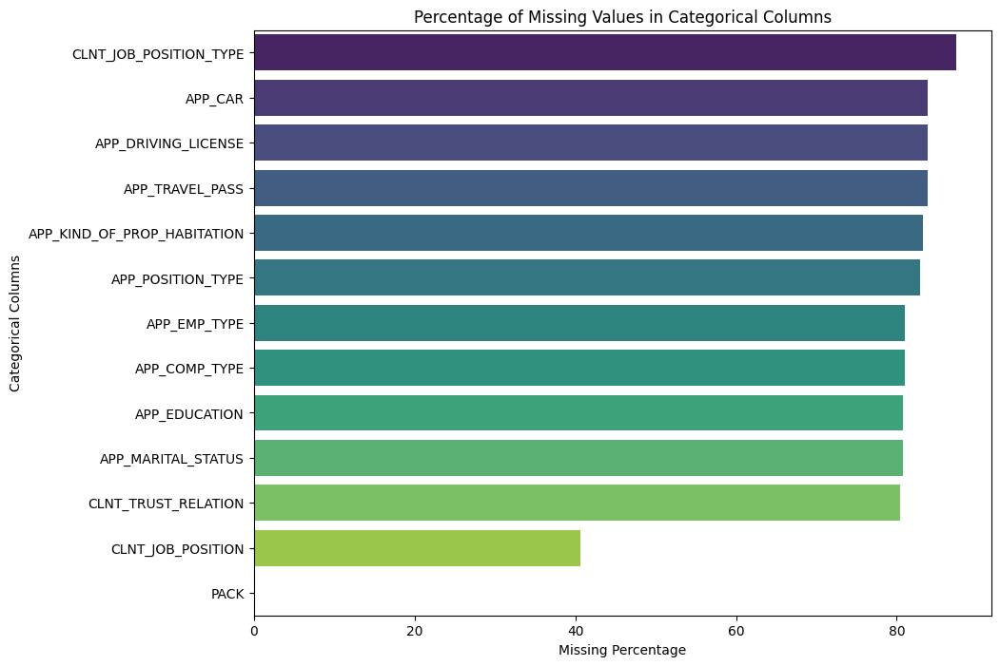

In [13]:
# Plotting missing categorical values
plt.figure(figsize=(10, 8))
sns.barplot(x='Missing Percentage', y='Column', data=missing_percentages_df_cat, palette='viridis')

plt.title('Percentage of Missing Values in Categorical Columns')
plt.xlabel('Missing Percentage')
plt.ylabel('Categorical Columns')
plt.show()

In [14]:
# percentage of missing numerical values in each column
missing_percentages_numerical = numerical_data_df.isnull().sum() / len(numerical_data_df) * 100


missing_percentages_df_num = pd.DataFrame({'Column': numerical_data_df.columns, 'Missing Percentage': missing_percentages_numerical})
missing_percentages_df_num.sort_values(by='Missing Percentage', ascending=False, inplace=True)

missing_num_80=missing_percentages_df_num[missing_percentages_df_num['Missing Percentage'] > 80]

missing_percentages_df_num[missing_percentages_df_num['Missing Percentage'] > 0]


,Column,Missing Percentage
CLNT_SALARY_VALUE,CLNT_SALARY_VALUE,99.799544
LDEAL_YQZ_COM,LDEAL_YQZ_COM,99.650891
LDEAL_YQZ_CHRG,LDEAL_YQZ_CHRG,99.650610
AVG_PCT_MONTH_TO_PCLOSE,AVG_PCT_MONTH_TO_PCLOSE,99.541654
MAX_PCLOSE_DATE,MAX_PCLOSE_DATE,99.470424
AVG_PCT_DEBT_TO_DEAL_AMT,AVG_PCT_DEBT_TO_DEAL_AMT,99.468454
LDEAL_AMT_MONTH,LDEAL_AMT_MONTH,99.468454
LDEAL_YQZ_PC,LDEAL_YQZ_PC,99.209437
DEAL_YQZ_IR_MIN,DEAL_YQZ_IR_MIN,97.747403
LDEAL_TENOR_MAX,LDEAL_TENOR_MAX,97.747403


In [15]:
print(churn_data_bank_df.shape)
print(numerical_data_df.shape)
print(categorical_data_df.shape)

(355190, 116)
(355190, 102)
(355190, 13)


### About the dataset

1. The dataset contains information customers of a bank. It consists of 355190 rows and 116 columns.
2. There are no duplicate values and a lot of  misssing values/null values in the dataset. There are 115 Independent features and 'Target' is the target variable.
3. There are 102 numerical features(int and float data type) and 13 categorical features(object).
4. We'll investigate each variable further to understand their true data type.

## ***2. Understanding  Variables***







In [16]:
# Dataset Columns
churn_data_bank_df.columns

Index(['ID', 'CR_PROD_CNT_IL', 'AMOUNT_RUB_CLO_PRC',
       'PRC_ACCEPTS_A_EMAIL_LINK', 'APP_REGISTR_RGN_CODE', 'PRC_ACCEPTS_A_POS',
       'PRC_ACCEPTS_A_TK', 'TURNOVER_DYNAMIC_IL_1M', 'CNT_TRAN_AUT_TENDENCY1M',
       'SUM_TRAN_AUT_TENDENCY1M',
       ...
       'REST_DYNAMIC_CC_3M', 'MED_DEBT_PRC_YWZ', 'LDEAL_ACT_DAYS_PCT_TR3',
       'LDEAL_ACT_DAYS_PCT_AAVG', 'LDEAL_DELINQ_PER_MAXYWZ',
       'TURNOVER_DYNAMIC_CC_3M', 'LDEAL_ACT_DAYS_PCT_TR',
       'LDEAL_ACT_DAYS_PCT_TR4', 'LDEAL_ACT_DAYS_PCT_CURR', 'TARGET'],
      dtype='object', length=116)

In [17]:
# Sorting columns alphabetically to group features into one variable to analyse them separately.
churn_data_bank_df_sorted_alphabetically = churn_data_bank_df[sorted(churn_data_bank_df.columns)]

churn_data_bank_df_sorted_alphabetically.head()


,AGE,AMOUNT_RUB_ATM_PRC,AMOUNT_RUB_CLO_PRC,AMOUNT_RUB_NAS_PRC,AMOUNT_RUB_SUP_PRC,APP_CAR,APP_COMP_TYPE,APP_DRIVING_LICENSE,APP_EDUCATION,APP_EMP_TYPE,APP_KIND_OF_PROP_HABITATION,APP_MARITAL_STATUS,APP_POSITION_TYPE,APP_REGISTR_RGN_CODE,APP_TRAVEL_PASS,AVG_PCT_DEBT_TO_DEAL_AMT,AVG_PCT_MONTH_TO_PCLOSE,CLNT_JOB_POSITION,CLNT_JOB_POSITION_TYPE,CLNT_SALARY_VALUE,CLNT_SETUP_TENOR,CLNT_TRUST_RELATION,CNT_ACCEPTS_MTP,CNT_ACCEPTS_TK,CNT_TRAN_ATM_TENDENCY1M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_AUT_TENDENCY1M,CNT_TRAN_AUT_TENDENCY3M,CNT_TRAN_CLO_TENDENCY1M,CNT_TRAN_CLO_TENDENCY3M,CNT_TRAN_MED_TENDENCY1M,CNT_TRAN_MED_TENDENCY3M,CNT_TRAN_SUP_TENDENCY1M,CNT_TRAN_SUP_TENDENCY3M,CR_PROD_CNT_CC,CR_PROD_CNT_CCFP,CR_PROD_CNT_IL,CR_PROD_CNT_PIL,CR_PROD_CNT_TOVR,CR_PROD_CNT_VCU,DEAL_GRACE_DAYS_ACC_AVG,DEAL_GRACE_DAYS_ACC_MAX,DEAL_GRACE_DAYS_ACC_S1X1,DEAL_YQZ_IR_MAX,DEAL_YQZ_IR_MIN,DEAL_YWZ_IR_MAX,DEAL_YWZ_IR_MIN,ID,LDEAL_ACT_DAYS_ACC_PCT_AVG,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_ACT_DAYS_PCT_CURR,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_AMT_MONTH,LDEAL_DELINQ_PER_MAXYQZ,LDEAL_DELINQ_PER_MAXYWZ,LDEAL_GRACE_DAYS_PCT_MED,LDEAL_TENOR_MAX,LDEAL_TENOR_MIN,LDEAL_USED_AMT_AVG_YQZ,LDEAL_USED_AMT_AVG_YWZ,LDEAL_YQZ_CHRG,LDEAL_YQZ_COM,LDEAL_YQZ_PC,MAX_PCLOSE_DATE,MED_DEBT_PRC_YQZ,MED_DEBT_PRC_YWZ,PACK,PRC_ACCEPTS_A_AMOBILE,PRC_ACCEPTS_A_ATM,PRC_ACCEPTS_A_EMAIL_LINK,PRC_ACCEPTS_A_MTP,PRC_ACCEPTS_A_POS,PRC_ACCEPTS_A_TK,PRC_ACCEPTS_MTP,PRC_ACCEPTS_TK,REST_AVG_CUR,REST_AVG_PAYM,REST_DYNAMIC_CC_1M,REST_DYNAMIC_CC_3M,REST_DYNAMIC_CUR_1M,REST_DYNAMIC_CUR_3M,REST_DYNAMIC_FDEP_1M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,REST_DYNAMIC_IL_3M,REST_DYNAMIC_PAYM_1M,REST_DYNAMIC_PAYM_3M,REST_DYNAMIC_SAVE_3M,SUM_TRAN_ATM_TENDENCY1M,SUM_TRAN_ATM_TENDENCY3M,SUM_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY3M,SUM_TRAN_CLO_TENDENCY1M,SUM_TRAN_CLO_TENDENCY3M,SUM_TRAN_MED_TENDENCY1M,SUM_TRAN_MED_TENDENCY3M,SUM_TRAN_SUP_TENDENCY1M,SUM_TRAN_SUP_TENDENCY3M,TARGET,TRANS_AMOUNT_TENDENCY3M,TRANS_CNT_TENDENCY3M,TRANS_COUNT_ATM_PRC,TRANS_COUNT_NAS_PRC,TRANS_COUNT_SUP_PRC,TURNOVER_CC,TURNOVER_DYNAMIC_CC_1M,TURNOVER_DYNAMIC_CC_3M,TURNOVER_DYNAMIC_CUR_1M,TURNOVER_DYNAMIC_CUR_3M,TURNOVER_DYNAMIC_IL_1M,TURNOVER_DYNAMIC_IL_3M,TURNOVER_DYNAMIC_PAYM_1M,TURNOVER_DYNAMIC_PAYM_3M,TURNOVER_PAYM
0,660,1.000000,0.000000,0.0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,начальник отдела,NaN,NaN,1.593023,NaN,NaN,NaN,0.101695,0.406780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,146841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,K01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,156067.339767,0.0,0.0,0.0,0.134651,0.474134,0.0,0.0,0.0,0.0,0.0,0.0,0.541683,0.134634,0.483032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.483032,0.406780,1.000000,0.0,0.000000,0.0,0.0,0.0,0.131910,0.442285,0.0,0.0,0.0,0.0,0.0
1,552,0.410691,0.041033,0.0,0.244678,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.587647,NaN,NaN,NaN,0.166667,0.333333,0.166667,0.666667,NaN,NaN,NaN,NaN,0.24,0.6,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,146842,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4278.845817,0.0,0.0,0.0,0.239365,0.384264,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.133333,0.200000,0.186107,0.670968,NaN,NaN,NaN,NaN,0.309799,0.510712,0,0.394340,0.545455,0.109091,0.0,0.454545,0.0,0.0,0.0,0.101934,0.515876,0.0,0.0,0.0,0.0,0.0
2,420,0.925140,0.006915,0.0,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ГЕНЕРАЛЬНЫЙ ДИРЕКТОР,NaN,NaN,1.587647,NaN,0.0,0.0,0.133333,0.366667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,146843,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,112837.062817,0.0,0.0,0.0,0.084341,0.336136,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.063129,0.431656,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0.399342,0.297297,0.810811,0.0,0.000000,0.0,0.0,0.0,0.121041,0.522833,0.0,0.0,0.0,0.0,0.0
3,372,1.000000,

In [18]:
# Churn sample
# Create a sample of the dataset only this time and save to Google drive for consistency
# churn_data_bank_df_sample  = churn_data_bank_df.sample(1000)
# filename = 'bank_data_train_sample.csv'
# churn_data_bank_df_sample.to_csv('/content/drive/MyDrive/' + filename)

# Get the sample data from Google drive
churn_data_bank_df_sample = pd.read_csv('/content/drive/MyDrive/bank_data_train_sample.csv')

In [19]:
churn_data_bank_df_sample.shape

(1000, 117)

In [20]:
# numerical and categorical data in separate variables
numerical_data_df_s = churn_data_bank_df_sample[numerical_columns]
categorical_data_df_s = churn_data_bank_df_sample[categorical_columns]


In [21]:
# percentage of missing numerical values in the sample data
missing_percentages_numerical_s = numerical_data_df_s.isnull().sum() / len(numerical_data_df_s) * 100


missing_percentages_df_num_s = pd.DataFrame({'Column': numerical_data_df_s.columns, 'Missing Percentage': missing_percentages_numerical_s})
missing_percentages_df_num_s.sort_values(by='Missing Percentage', ascending=False, inplace=True)

missing_num_80_s=missing_percentages_df_num_s[missing_percentages_df_num_s['Missing Percentage'] > 80]

missing_percentages_df_num_s[missing_percentages_df_num_s['Missing Percentage'] > 0]

,Column,Missing Percentage
AVG_PCT_DEBT_TO_DEAL_AMT,AVG_PCT_DEBT_TO_DEAL_AMT,99.9
AVG_PCT_MONTH_TO_PCLOSE,AVG_PCT_MONTH_TO_PCLOSE,99.9
MAX_PCLOSE_DATE,MAX_PCLOSE_DATE,99.9
CLNT_SALARY_VALUE,CLNT_SALARY_VALUE,99.9
LDEAL_AMT_MONTH,LDEAL_AMT_MONTH,99.9
LDEAL_YQZ_CHRG,LDEAL_YQZ_CHRG,99.7
LDEAL_YQZ_COM,LDEAL_YQZ_COM,99.7
LDEAL_YQZ_PC,LDEAL_YQZ_PC,99.3
DEAL_YQZ_IR_MIN,DEAL_YQZ_IR_MIN,97.8
LDEAL_TENOR_MAX,LDEAL_TENOR_MAX,97.8


In [22]:
# Sampled the data to include previously removed CLNT_JOB_POSITION
# columns_that_can_be_removed.append('CLNT_JOB_POSITION')
churn_data_bank_df_sample.value_counts('CLNT_JOB_POSITION')

CLNT_JOB_POSITION
ДИРЕКТОР                               27
директор                               19
Директор                               14
менеджер                               14
МЕНЕДЖЕР                               14
ИНЖЕНЕР                                 9
Менеджер                                8
ГЕНЕРАЛЬНЫЙ ДИРЕКТОР                    6
ПРЕДПРИНИМАТЕЛЬ                         5
предприниматель                         5
Генеральный директор                    5
Руководитель                            5
РУКОВОДИТЕЛЬ                            5
ЗАМЕСТИТЕЛЬ ДИРЕКТОРА                   4
СТУДЕНТ                                 4
инженер                                 4
АДМИНИСТРАТОР                           4
Бухгалтер                               4
генеральный директор                    4
ЮРИСТ                                   4
МЕНЕДЖЕР ПО ПРОДАЖАМ                    4
продавец                                3
Индивидуальный предприниматель          3
ИП              

In [23]:
numerical_columns

['ID',
 'CR_PROD_CNT_IL',
 'AMOUNT_RUB_CLO_PRC',
 'PRC_ACCEPTS_A_EMAIL_LINK',
 'APP_REGISTR_RGN_CODE',
 'PRC_ACCEPTS_A_POS',
 'PRC_ACCEPTS_A_TK',
 'TURNOVER_DYNAMIC_IL_1M',
 'CNT_TRAN_AUT_TENDENCY1M',
 'SUM_TRAN_AUT_TENDENCY1M',
 'AMOUNT_RUB_SUP_PRC',
 'PRC_ACCEPTS_A_AMOBILE',
 'SUM_TRAN_AUT_TENDENCY3M',
 'PRC_ACCEPTS_TK',
 'PRC_ACCEPTS_A_MTP',
 'REST_DYNAMIC_FDEP_1M',
 'CNT_TRAN_AUT_TENDENCY3M',
 'CNT_ACCEPTS_TK',
 'REST_DYNAMIC_SAVE_3M',
 'CR_PROD_CNT_VCU',
 'REST_AVG_CUR',
 'CNT_TRAN_MED_TENDENCY1M',
 'AMOUNT_RUB_NAS_PRC',
 'TRANS_COUNT_SUP_PRC',
 'CNT_TRAN_CLO_TENDENCY1M',
 'SUM_TRAN_MED_TENDENCY1M',
 'PRC_ACCEPTS_A_ATM',
 'PRC_ACCEPTS_MTP',
 'TRANS_COUNT_NAS_PRC',
 'CNT_ACCEPTS_MTP',
 'CR_PROD_CNT_TOVR',
 'CR_PROD_CNT_PIL',
 'SUM_TRAN_CLO_TENDENCY1M',
 'TURNOVER_CC',
 'TRANS_COUNT_ATM_PRC',
 'AMOUNT_RUB_ATM_PRC',
 'TURNOVER_PAYM',
 'AGE',
 'CNT_TRAN_MED_TENDENCY3M',
 'CR_PROD_CNT_CC',
 'SUM_TRAN_MED_TENDENCY3M',
 'REST_DYNAMIC_FDEP_3M',
 'REST_DYNAMIC_IL_1M',
 'SUM_TRAN_CLO_TENDEN

In [24]:
categorical_columns

Index(['CLNT_TRUST_RELATION', 'APP_MARITAL_STATUS',
       'APP_KIND_OF_PROP_HABITATION', 'CLNT_JOB_POSITION_TYPE',
       'CLNT_JOB_POSITION', 'APP_DRIVING_LICENSE', 'APP_EDUCATION',
       'APP_TRAVEL_PASS', 'APP_CAR', 'APP_POSITION_TYPE', 'APP_EMP_TYPE',
       'APP_COMP_TYPE', 'PACK'],
      dtype='object')

### Variables Description

The dataset contains various columns related to customer transactions, acceptance rates, turnover dynamics, and other financial metrics. Here's a summary of the columns and their descriptions:

## Numerical Features
- ID: Unique identifier for each entry.
- CR_PROD_CNT_IL, CR_PROD_CNT_VCU, CR_PROD_CNT_TOVR, CR_PROD_CNT_PIL, CR_PROD_CNT_CC, CR_PROD_CNT_CCFP: Counts of different credit products.

- AMOUNT_RUB_CLO_PRC, AMOUNT_RUB_SUP_PRC, AMOUNT_RUB_NAS_PRC, AMOUNT_RUB_ATM_PRC: The fraction of transactions with MCC to the whole amount of transactions in the period(RUB).

- PRC_ACCEPTS_A_EMAIL_LINK, PRC_ACCEPTS_A_POS, PRC_ACCEPTS_A_TK, PRC_ACCEPTS_A_AMOBILE, PRC_ACCEPTS_A_MTP, PRC_ACCEPTS_A_ATM, PRC_ACCEPTS_MTP: %  of accepts in channels / product groups.

- TURNOVER_DYNAMIC_IL_1M, TURNOVER_DYNAMIC_IL_3M, TURNOVER_CC, TURNOVER_DYNAMIC_CUR_1M, TURNOVER_DYNAMIC_CUR_3M, TURNOVER_DYNAMIC_PAYM_1M, TURNOVER_DYNAMIC_PAYM_3M, TURNOVER_DYNAMIC_CC_1M, TURNOVER_DYNAMIC_CC_3M: Turnover dynamics over 1 month and 3 month periods and for different types of transactions.

-TURNOVER_PAYM - Average turnover of salary accounts.

- CNT_TRAN_AUT_TENDENCY1M, CNT_TRAN_AUT_TENDENCY3M, CNT_TRAN_MED_TENDENCY1M, CNT_TRAN_MED_TENDENCY3M, CNT_TRAN_CLO_TENDENCY1M, CNT_TRAN_CLO_TENDENCY3M, CNT_TRAN_SUP_TENDENCY1M, CNT_TRAN_SUP_TENDENCY3M, CNT_TRAN_ATM_TENDENCY1M, CNT_TRAN_ATM_TENDENCY3M: Trend of transactions number by the MCC type with tendencies over 1 and 3 month periods.

- SUM_TRAN_AUT_TENDENCY1M, SUM_TRAN_AUT_TENDENCY3M, SUM_TRAN_MED_TENDENCY1M, SUM_TRAN_MED_TENDENCY3M, SUM_TRAN_CLO_TENDENCY1M, SUM_TRAN_CLO_TENDENCY3M, SUM_TRAN_SUP_TENDENCY1M, SUM_TRAN_SUP_TENDENCY3M, SUM_TRAN_ATM_TENDENCY1M, SUM_TRAN_ATM_TENDENCY3M: Trend of transactions amounts per MCC with tendencies over 1 and 3 month periods.

- REST_DYNAMIC_FDEP_1M, REST_DYNAMIC_FDEP_3M, REST_DYNAMIC_IL_1M, REST_DYNAMIC_IL_3M, REST_DYNAMIC_CUR_1M, REST_DYNAMIC_CUR_3M, REST_DYNAMIC_SAVE_3M, REST_DYNAMIC_PAYM_1M, REST_DYNAMIC_PAYM_3M, REST_DYNAMIC_CC_1M, REST_DYNAMIC_CC_3M: Trend of monthly average account balances per products (1 or 3 months).

- TRANS_COUNT_SUP_PRC, TRANS_COUNT_NAS_PRC, TRANS_COUNT_ATM_PRC: Ratio of MCC transactions to the all transactions in the period.

- AGE: Age of the customer.

- LDEAL_TENOR_MAX, LDEAL_TENOR_MIN: Maximum and minimum deal tenure.

- LDEAL_USED_AMT_AVG_YQZ, LDEAL_USED_AMT_AVG_YWZ: Average deal amount used.

- LDEAL_AMT_MONTH, LDEAL_YQZ_CHRG, LDEAL_YQZ_COM, LDEAL_YQZ_PC, LDEAL_GRACE_DAYS_PCT_MED, LDEAL_DELINQ_PER_MAXYQZ, LDEAL_DELINQ_PER_MAXYWZ: Other product metrics in the period(credit contracts)


- DEAL_GRACE_DAYS_ACC_S1X1, DEAL_GRACE_DAYS_ACC_AVG, DEAL_GRACE_DAYS_ACC_MAX: Grace Metrics

- DEAL_YQZ_IR_MAX, DEAL_YQZ_IR_MIN, DEAL_YWZ_IR_MAX, DEAL_YWZ_IR_MIN: Maximum and minumum interest rates for revolvers and annuities.

- REST_AVG_CUR, REST_AVG_PAYM: Average current account balances and average salary account balances.

- CNT_ACCEPTS_TK, CNT_ACCEPTS_MTP: Count of acceptances for different campaign channels.

- MAX_PCLOSE_DATE: Number of months until planned credit close date (Maximum with annuities)

- CLNT_SETUP_TENOR: Months of being a customer.

- CLNT_SALARY_VALUE: Client salary value.

- TRANS_AMOUNT_TENDENCY3M: Ratio between transaction sum in the last 3 months to the 6 months.

- TRANS_CNT_TENDENCY3M: Ration between transaction number in the last 3 months to the 6 months.

- MED_DEBT_PRC_YQZ, MED_DEBT_PRC_YWZ: Median debt percentages for annuities and revolvers.


- AVG_PCT_DEBT_TO_DEAL_AMT - Average percentage of debt to deal amount (average annuity)

-  AVG_PCT_MONTH_TO_PCLOSE: Average percentage of the credit term left.

- LDEAL_ACT_DAYS_ACC_PCT_AVG, LDEAL_ACT_DAYS_PCT_TR3, LDEAL_ACT_DAYS_PCT_AAVG, LDEAL_ACT_DAYS_PCT_TR, LDEAL_ACT_DAYS_PCT_TR4, LDEAL_ACT_DAYS_PCT_CURR: Metrics of activity in the period (credit contracts).



In the context of financial terms:

- **Revolvers**: These are individuals who carry a balance on their credit cards from month to month, rather than paying it off entirely. They typically pay interest on the remaining balance.

- **Annuities**: In the financial context, annuities usually refer to financial products sold by insurance companies, designed to provide regular payments to the holder, often starting at retirement.

## Categorical Features

Here are the variable descriptions for the columns in your dataset:

1. **APP_CAR**: Indicates whether the applicant owns a car.
2. **APP_COMP_TYPE**: Type of company where the applicant works.
3. **APP_DRIVING_LICENSE**: Indicates whether the applicant has a driving license.
4. **APP_EDUCATION**: Education level of the applicant.
5. **APP_EMP_TYPE**: Type of employment of the applicant.
6. **APP_KIND_OF_PROP_HABITATION**: Type of property where the applicant lives.
7. **APP_MARITAL_STATUS**: Marital status of the applicant.
8. **APP_POSITION_TYPE**: Job position type of the applicant.
9. **APP_TRAVEL_PASS**: International passport
10. **CLNT_JOB_POSITION**: Specific job position of the client.
11. **CLNT_JOB_POSITION_TYPE**: General job position type of the client.
12. **CLNT_TRUST_RELATION**: Type of trust relationship with the client.
13. **PACK**: Type of service package the client has.


- **TARGET**: Target variable indicating the outcome (churn or not).




In [25]:
# Creating lists to categorize similar features

# Credit Products Count
credit_products_count = [
    'CR_PROD_CNT_IL', 'CR_PROD_CNT_VCU', 'CR_PROD_CNT_TOVR',
    'CR_PROD_CNT_PIL', 'CR_PROD_CNT_CC', 'CR_PROD_CNT_CCFP'
]

# Amounts in Rubles for Transaction Types
amounts_rub_transaction_types = [
    'AMOUNT_RUB_CLO_PRC', 'AMOUNT_RUB_SUP_PRC',
    'AMOUNT_RUB_NAS_PRC', 'AMOUNT_RUB_ATM_PRC'
]

# Acceptance Percentages for Services
acceptance_percentages = [
    'PRC_ACCEPTS_A_EMAIL_LINK', 'PRC_ACCEPTS_A_POS', 'PRC_ACCEPTS_A_TK',
    'PRC_ACCEPTS_A_AMOBILE', 'PRC_ACCEPTS_A_MTP', 'PRC_ACCEPTS_A_ATM',
    'PRC_ACCEPTS_MTP','PRC_ACCEPTS_TK'
]

# Turnover Dynamics
turnover_dynamics = [
    'TURNOVER_DYNAMIC_IL_1M', 'TURNOVER_DYNAMIC_IL_3M', 'TURNOVER_CC',
    'TURNOVER_DYNAMIC_CUR_1M', 'TURNOVER_DYNAMIC_CUR_3M',
    'TURNOVER_DYNAMIC_PAYM_1M', 'TURNOVER_DYNAMIC_PAYM_3M',
    'TURNOVER_DYNAMIC_CC_1M', 'TURNOVER_DYNAMIC_CC_3M', 'TURNOVER_PAYM'
]

# Transaction Trend Counts by MCC Type
transaction_trend_counts = [
    'CNT_TRAN_AUT_TENDENCY1M', 'CNT_TRAN_AUT_TENDENCY3M',
    'CNT_TRAN_MED_TENDENCY1M', 'CNT_TRAN_MED_TENDENCY3M',
    'CNT_TRAN_CLO_TENDENCY1M', 'CNT_TRAN_CLO_TENDENCY3M',
    'CNT_TRAN_SUP_TENDENCY1M', 'CNT_TRAN_SUP_TENDENCY3M',
    'CNT_TRAN_ATM_TENDENCY1M', 'CNT_TRAN_ATM_TENDENCY3M'
]

# Transaction Trend Sums by MCC Type
transaction_trend_sums_per_MCC = [
    'SUM_TRAN_AUT_TENDENCY1M', 'SUM_TRAN_AUT_TENDENCY3M',
    'SUM_TRAN_MED_TENDENCY1M', 'SUM_TRAN_MED_TENDENCY3M',
    'SUM_TRAN_CLO_TENDENCY1M', 'SUM_TRAN_CLO_TENDENCY3M',
    'SUM_TRAN_SUP_TENDENCY1M', 'SUM_TRAN_SUP_TENDENCY3M',
    'SUM_TRAN_ATM_TENDENCY1M', 'SUM_TRAN_ATM_TENDENCY3M'
]

# Monthly Average Account Balances
monthly_avg_balances_per_products = [
    'REST_DYNAMIC_FDEP_1M', 'REST_DYNAMIC_FDEP_3M',
    'REST_DYNAMIC_IL_1M', 'REST_DYNAMIC_IL_3M',
    'REST_DYNAMIC_CUR_1M', 'REST_DYNAMIC_CUR_3M',
    'REST_DYNAMIC_SAVE_3M', 'REST_DYNAMIC_PAYM_1M',
    'REST_DYNAMIC_PAYM_3M', 'REST_DYNAMIC_CC_1M',
    'REST_DYNAMIC_CC_3M'
]

# Transaction Ratio by MCC Type
transaction_ratio_mcc = [
    'TRANS_COUNT_SUP_PRC', 'TRANS_COUNT_NAS_PRC', 'TRANS_COUNT_ATM_PRC'
]

# Customer Demographics and Characteristics
customer_characteristics = [
    'AGE',

     'REST_AVG_CUR', 'REST_AVG_PAYM',
    'CNT_ACCEPTS_TK', 'CNT_ACCEPTS_MTP', 'MAX_PCLOSE_DATE',
    'CLNT_SETUP_TENOR', 'CLNT_SALARY_VALUE',
    'TRANS_AMOUNT_TENDENCY3M', 'TRANS_CNT_TENDENCY3M',
    'MED_DEBT_PRC_YQZ', 'MED_DEBT_PRC_YWZ',
    'AVG_PCT_DEBT_TO_DEAL_AMT', 'AVG_PCT_MONTH_TO_PCLOSE'

]

#Product_metrics_credit_contracts
Product_metrics_credit_contracts=['LDEAL_ACT_DAYS_ACC_PCT_AVG', 'LDEAL_ACT_DAYS_PCT_TR3',
    'LDEAL_ACT_DAYS_PCT_AAVG', 'LDEAL_ACT_DAYS_PCT_TR',
    'LDEAL_ACT_DAYS_PCT_TR4', 'LDEAL_ACT_DAYS_PCT_CURR', 'LDEAL_TENOR_MAX', 'LDEAL_TENOR_MIN',
    'LDEAL_USED_AMT_AVG_YQZ', 'LDEAL_USED_AMT_AVG_YWZ',
    'LDEAL_YQZ_CHRG', 'LDEAL_YQZ_COM', 'LDEAL_YQZ_PC',
    'LDEAL_GRACE_DAYS_PCT_MED','LDEAL_DELINQ_PER_MAXYQZ', 'LDEAL_DELINQ_PER_MAXYWZ', 'LDEAL_AMT_MONTH']


#Grace Metrics

Grace_metrics=['DEAL_GRACE_DAYS_ACC_S1X1','DEAL_GRACE_DAYS_ACC_AVG', 'DEAL_GRACE_DAYS_ACC_MAX', ]



#Max_Min_interest_rate_revolvers_annuities

Max_Min_interest_rate_revolvers_annuities=['DEAL_YQZ_IR_MAX', 'DEAL_YQZ_IR_MIN', 'DEAL_YWZ_IR_MAX',
    'DEAL_YWZ_IR_MIN']









In [26]:
# Checking the number of unique values in acceptance_percentages
for i in acceptance_percentages:
  print(f"Value counts for {i}:\n{numerical_data_df[i].value_counts()}\n")

Value counts for PRC_ACCEPTS_A_EMAIL_LINK:
PRC_ACCEPTS_A_EMAIL_LINK
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_A_POS:
PRC_ACCEPTS_A_POS
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_A_TK:
PRC_ACCEPTS_A_TK
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_A_AMOBILE:
PRC_ACCEPTS_A_AMOBILE
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_A_MTP:
PRC_ACCEPTS_A_MTP
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_A_ATM:
PRC_ACCEPTS_A_ATM
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_MTP:
PRC_ACCEPTS_MTP
0.0    155163
Name: count, dtype: int64

Value counts for PRC_ACCEPTS_TK:
PRC_ACCEPTS_TK
0.0    155163
Name: count, dtype: int64



Inference:
Percentage of acceptance in channels/ product groups seems to 0 percent and half are null values.
These columns can be removed after further investigation.

In [27]:
# updating my list.
# Run this cell only once.
columns_that_can_be_removed.extend(acceptance_percentages)

In [28]:
# Value counts for credit_products_count
# DataFrame to store value counts
value_counts_df = pd.DataFrame(columns=['Variable', 'Value', 'Count'])

#
for var in credit_products_count:

    counts = numerical_data_df[var].value_counts().reset_index()
    counts.columns = ['Value', 'Count']


    counts['Variable'] = var


    value_counts_df = pd.concat([value_counts_df, counts], ignore_index=True)

# Display the result
print(value_counts_df)


            Variable Value   Count
0     CR_PROD_CNT_IL     0  328025
1     CR_PROD_CNT_IL     1   20533
2     CR_PROD_CNT_IL     2    4484
3     CR_PROD_CNT_IL     3    1313
4     CR_PROD_CNT_IL     4     508
5     CR_PROD_CNT_IL     5     189
6     CR_PROD_CNT_IL     6      73
7     CR_PROD_CNT_IL     7      34
8     CR_PROD_CNT_IL     9      14
9     CR_PROD_CNT_IL     8       9
10    CR_PROD_CNT_IL    10       4
11    CR_PROD_CNT_IL    11       4
12   CR_PROD_CNT_VCU     0  344721
13   CR_PROD_CNT_VCU     1    9878
14   CR_PROD_CNT_VCU     2     565
15   CR_PROD_CNT_VCU     3      25
16   CR_PROD_CNT_VCU     4       1
17  CR_PROD_CNT_TOVR     0  263991
18  CR_PROD_CNT_TOVR     1   75945
19  CR_PROD_CNT_TOVR     2   12327
20  CR_PROD_CNT_TOVR     3    2403
21  CR_PROD_CNT_TOVR     4     418
22  CR_PROD_CNT_TOVR     5      78
23  CR_PROD_CNT_TOVR     6      10
24  CR_PROD_CNT_TOVR     8       6
25  CR_PROD_CNT_TOVR     7       5
26  CR_PROD_CNT_TOVR     9       3
27  CR_PROD_CNT_TOVR

It can be seen that above features are categorical variables representing count of each product type. These will be added into categorical columns.

In [29]:
categorical_columns=list(categorical_columns)

In [30]:
# run this cell only once
categorical_columns.extend(credit_products_count)

In [31]:
# Number of accepts in different campaign channels
print(numerical_data_df['CNT_ACCEPTS_TK'].value_counts())
print(numerical_data_df['CNT_ACCEPTS_MTP'].value_counts())


CNT_ACCEPTS_TK
0.0    155163
Name: count, dtype: int64
CNT_ACCEPTS_MTP
0.0    155163
Name: count, dtype: int64


The variables CNT_ACCEPTS_TK and CNT_ACCEPTS_MTP represent the count of accepts in different campaign channels.

CNT_ACCEPTS_TK: The value 0.0 appears 155163 times, indicating that in a significant number of entries, there were no accepts in the campaign channel identified as TK.

CNT_ACCEPTS_MTP: Similarly, the value 0.0 appears 155163 times, suggesting that there were no accepts in the campaign channel identified as MTP in the same set of entries.

This could be either a lack of usage or no recorded accepts in these specific campaign channels for those entries in your dataset.

Also, these can be considered as categorical features rather than numerical.

In [32]:
# appending to categorical columns
# run this cell only once.
categorical_columns.append('CNT_ACCEPTS_TK')
categorical_columns.append('CNT_ACCEPTS_MTP')

In [33]:
categorical_columns

['CLNT_TRUST_RELATION',
 'APP_MARITAL_STATUS',
 'APP_KIND_OF_PROP_HABITATION',
 'CLNT_JOB_POSITION_TYPE',
 'CLNT_JOB_POSITION',
 'APP_DRIVING_LICENSE',
 'APP_EDUCATION',
 'APP_TRAVEL_PASS',
 'APP_CAR',
 'APP_POSITION_TYPE',
 'APP_EMP_TYPE',
 'APP_COMP_TYPE',
 'PACK',
 'CR_PROD_CNT_IL',
 'CR_PROD_CNT_VCU',
 'CR_PROD_CNT_TOVR',
 'CR_PROD_CNT_PIL',
 'CR_PROD_CNT_CC',
 'CR_PROD_CNT_CCFP',
 'CNT_ACCEPTS_TK',
 'CNT_ACCEPTS_MTP']

In [34]:
numerical_data_df.head()

,ID,CR_PROD_CNT_IL,AMOUNT_RUB_CLO_PRC,PRC_ACCEPTS_A_EMAIL_LINK,APP_REGISTR_RGN_CODE,PRC_ACCEPTS_A_POS,PRC_ACCEPTS_A_TK,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,PRC_ACCEPTS_A_AMOBILE,SUM_TRAN_AUT_TENDENCY3M,PRC_ACCEPTS_TK,PRC_ACCEPTS_A_MTP,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,REST_DYNAMIC_SAVE_3M,CR_PROD_CNT_VCU,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,AMOUNT_RUB_NAS_PRC,TRANS_COUNT_SUP_PRC,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,PRC_ACCEPTS_A_ATM,PRC_ACCEPTS_MTP,TRANS_COUNT_NAS_PRC,CNT_ACCEPTS_MTP,CR_PROD_CNT_TOVR,CR_PROD_CNT_PIL,SUM_TRAN_CLO_TENDENCY1M,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,CR_PROD_CNT_CC,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,SUM_TRAN_CLO_TENDENCY3M,LDEAL_TENOR_MAX,LDEAL_YQZ_CHRG,CR_PROD_CNT_CCFP,DEAL_YQZ_IR_MAX,LDEAL_YQZ_COM,DEAL_YQZ_IR_MIN,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_TENOR_MIN,LDEAL_AMT_MONTH,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,AVG_PCT_MONTH_TO_PCLOSE,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,MAX_PCLOSE_DATE,LDEAL_YQZ_PC,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,LDEAL_DELINQ_PER_MAXYQZ,TURNOVER_DYNAMIC_PAYM_1M,CLNT_SALARY_VALUE,TRANS_AMOUNT_TENDENCY3M,MED_DEBT_PRC_YQZ,TRANS_CNT_TENDENCY3M,LDEAL_USED_AMT_AVG_YQZ,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,AVG_PCT_DEBT_TO_DEAL_AMT,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR
0,146841,0,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.541683,0,156067.339767,NaN,0.0,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,0.0,1.000000,1.000000,0.0,660,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.134651,0.0,NaN,NaN,0.0,0.474134,NaN,0.131910,0.0,NaN,0.0,0.406780,0.101695,0.0,0.483032,NaN,NaN,NaN,NaN,NaN,0.134634,0.0,NaN,NaN,0.442285,NaN,NaN,1.593023,NaN,0.0,NaN,0.0,NaN,0.483032,NaN,0.406780,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
1,146842,0,0.041033,NaN,NaN,NaN,NaN,0.0,0.166667,0.186107,0.244678,NaN,0.670968,NaN,NaN,0.0,0.666667,NaN,0.000000,0,4278.845817,NaN,0.0,0.454545,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,0.0,0.109091,0.410691,0.0,552,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.239365,0.0,NaN,NaN,0.0,0.384264,0.6,0.101934,0.0,0.510712,0.0,0.333333,0.166667,0.0,0.200000,NaN,NaN,NaN,0.309799,NaN,0.133333,0.0,0.24,NaN,0.515876,NaN,NaN,1.587647,NaN,0.0,NaN,0.0,NaN,0.394340,NaN,0.545455,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
2,146843,0,0.006915,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.000000,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.000000,0,112837.062817,NaN,0.0,0.000000,NaN,NaN,0.0,0.0,0.0,0.0,0,0,NaN,0.0,0.810811,0.925140,0.0,420,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.084341,0.0,NaN,NaN,0.0,0.336136,NaN,0.121041,0.0,NaN,0.0,0.366667,0.133333,0.0,0.431656,NaN,NaN,NaN,NaN,NaN,0.063129,0.0,NaN,NaN,0.522833,NaN,NaN,1.587647,NaN,0.0,NaN,0.0,NaN,0.399342,NaN,0.297297,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN
3,146844,0,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.005874,0,42902.902883,NaN,0.0,0.000000,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,0.0,1.000000,1.000000,0.0,372,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.005659,0.0,NaN,NaN,0.0,0.019648,NaN,0.000005,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.000189,NaN,NaN,1.583333,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0

In [35]:
# Run this cell only once.
numerical_data_df.drop(columns=credit_products_count,inplace=True)
numerical_data_df.drop(columns=['CNT_ACCEPTS_TK','CNT_ACCEPTS_MTP'],inplace=True)


In [36]:
# updated Categorical column
categorical_columns = [
    'APP_CAR', 'APP_COMP_TYPE', 'APP_DRIVING_LICENSE', 'APP_EDUCATION',
    'APP_EMP_TYPE', 'APP_KIND_OF_PROP_HABITATION', 'APP_MARITAL_STATUS',
    'APP_POSITION_TYPE', 'APP_TRAVEL_PASS', 'CLNT_JOB_POSITION',
    'CLNT_JOB_POSITION_TYPE', 'CLNT_TRUST_RELATION', 'PACK',
    'CR_PROD_CNT_IL', 'CR_PROD_CNT_VCU', 'CR_PROD_CNT_TOVR',
    'CR_PROD_CNT_PIL', 'CR_PROD_CNT_CC', 'CR_PROD_CNT_CCFP',
    'CNT_ACCEPTS_TK', 'CNT_ACCEPTS_MTP'
]


updated_categorical_df = churn_data_bank_df[categorical_columns].copy()

updated_categorical_df.head()


,APP_CAR,APP_COMP_TYPE,APP_DRIVING_LICENSE,APP_EDUCATION,APP_EMP_TYPE,APP_KIND_OF_PROP_HABITATION,APP_MARITAL_STATUS,APP_POSITION_TYPE,APP_TRAVEL_PASS,CLNT_JOB_POSITION,CLNT_JOB_POSITION_TYPE,CLNT_TRUST_RELATION,PACK,CR_PROD_CNT_IL,CR_PROD_CNT_VCU,CR_PROD_CNT_TOVR,CR_PROD_CNT_PIL,CR_PROD_CNT_CC,CR_PROD_CNT_CCFP,CNT_ACCEPTS_TK,CNT_ACCEPTS_MTP
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,начальник отдела,NaN,NaN,K01,0,0,0,0,0,0,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102,0,0,0,0,0,0,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ГЕНЕРАЛЬНЫЙ ДИРЕКТОР,NaN,NaN,102,0,0,0,0,0,0,0.0,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,МЕНЕДЖЕР ИАО,NaN,NaN,K01,0,0,0,0,0,0,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,102,0,0,0,0,0,0,NaN,NaN


In [37]:
updated_categorical_df.shape

(355190, 21)

### Check Unique Values for each categorical variable.

In [38]:
# Check Unique Values for each variable.
for i in updated_categorical_df.columns.tolist():
  print('Number of unique values in ',i, 'is ', updated_categorical_df[i].nunique())

Number of unique values in  APP_CAR is  2
Number of unique values in  APP_COMP_TYPE is  4
Number of unique values in  APP_DRIVING_LICENSE is  2
Number of unique values in  APP_EDUCATION is  17
Number of unique values in  APP_EMP_TYPE is  4
Number of unique values in  APP_KIND_OF_PROP_HABITATION is  5
Number of unique values in  APP_MARITAL_STATUS is  13
Number of unique values in  APP_POSITION_TYPE is  4
Number of unique values in  APP_TRAVEL_PASS is  2
Number of unique values in  CLNT_JOB_POSITION is  19588
Number of unique values in  CLNT_JOB_POSITION_TYPE is  4
Number of unique values in  CLNT_TRUST_RELATION is  21
Number of unique values in  PACK is  12
Number of unique values in  CR_PROD_CNT_IL is  12
Number of unique values in  CR_PROD_CNT_VCU is  5
Number of unique values in  CR_PROD_CNT_TOVR is  13
Number of unique values in  CR_PROD_CNT_PIL is  9
Number of unique values in  CR_PROD_CNT_CC is  8
Number of unique values in  CR_PROD_CNT_CCFP is  5
Number of unique values in  CNT_

In [39]:
# CLNT_JOB_POSITION seems to have more values being a categorical variable. It seems it is a text column of job position names in inappropriate format. we will remove this column.
# columns_that_can_be_removed.append('CLNT_JOB_POSITION')


In [40]:

# columns_to_count = [
#      'APP_MARITAL_STATUS', 'APP_KIND_OF_PROP_HABITATION', 'CLNT_JOB_POSITION_TYPE',
#     'APP_DRIVING_LICENSE', 'APP_EDUCATION', 'APP_TRAVEL_PASS', 'APP_CAR',
#     'APP_POSITION_TYPE', 'APP_EMP_TYPE', 'APP_COMP_TYPE', 'PACK'
# ]


# value_counts_dict = {}


# for column in columns_to_count:
#     value_counts_dict[column] = churn_data_bank_df[column].value_counts()


# for column, value_counts in value_counts_dict.items():
#     print(f"Value counts for {column}:\n{value_counts}\n")


Columns like APP_MARITAL_STATUS, APP_KIND_OF_PROP_HABITATION, CLNT_JOB_POSITION_TYPE have distinct categorical values.

Some columns like APP_MARITAL_STATUS and APP_EDUCATION have variations in the same category, indicating possible data entry inconsistencies. Need to adjust this.

Binary Categories:
Columns like APP_DRIVING_LICENSE, APP_TRAVEL_PASS, and APP_CAR are binary, representing 'Yes' or 'No

In [41]:
# Handling data inconsistencies in APP_MARITAL_STATUS, APP_Education

#  mappings for APP_MARITAL_STATUS
marital_status_mapping = {
    'M': 'Married', 'm': 'Married',
    'V': 'Single', 'v': 'Single',
    'D': 'Divorced', 'd': 'Divorced',
    'T': 'Widowed', 't': 'Widowed',
    'W': 'Widowed', 'w': 'Widowed',
    'C': 'Civil Union',
    'N': 'Not Specified',
    '': 'Not Specified'
}

#  mappings for APP_EDUCATION
education_mapping = {
    'H': 'High School', 'h': 'High School',
    'SS': 'Some School',
    'UH': 'Undergraduate', 'uH': 'Undergraduate',
    'S': 'Secondary School', 's': 'Secondary School',
    'HH': 'Higher Education', 'HI': 'Higher Education',
    'i': 'Incomplete Higher', 'I': 'Incomplete Higher',
    'A': 'Associate Degree', 'a': 'Associate Degree',
    'e': 'Elementary', 'E': 'Elementary',
    'AC': 'Academic Degree', 'AV': 'Advanced Degree'
}

#
churn_data_bank_df_sample['APP_MARITAL_STATUS'] = churn_data_bank_df_sample['APP_MARITAL_STATUS'].map(marital_status_mapping)
churn_data_bank_df_sample['APP_EDUCATION'] = churn_data_bank_df_sample['APP_EDUCATION'].map(education_mapping)

# remaining missing values with 'Not Specified' for both columns
churn_data_bank_df_sample['APP_MARITAL_STATUS'].fillna('Not Specified', inplace=True)
churn_data_bank_df_sample['APP_EDUCATION'].fillna('Not Specified', inplace=True)


##  ***EDA***

I made a copy for my original dataset and change my column names to the names that are easy to intrepret. I also changed the values of columns sex, marriage and education(all categorical values) to their original form as per the variable description for better understanding in visualization.

Now my dataset is ready for visualization

## ***Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

In [42]:
# Visualize_data_df=EDA_churn_data_bank_df.copy()
Visualize_data_df = churn_data_bank_df_sample.copy()
Visualize_data_df.head()

,Unnamed: 0,ID,CR_PROD_CNT_IL,AMOUNT_RUB_CLO_PRC,PRC_ACCEPTS_A_EMAIL_LINK,APP_REGISTR_RGN_CODE,PRC_ACCEPTS_A_POS,PRC_ACCEPTS_A_TK,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,PRC_ACCEPTS_A_AMOBILE,SUM_TRAN_AUT_TENDENCY3M,CLNT_TRUST_RELATION,PRC_ACCEPTS_TK,PRC_ACCEPTS_A_MTP,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,APP_MARITAL_STATUS,REST_DYNAMIC_SAVE_3M,CR_PROD_CNT_VCU,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,APP_KIND_OF_PROP_HABITATION,CLNT_JOB_POSITION_TYPE,AMOUNT_RUB_NAS_PRC,CLNT_JOB_POSITION,APP_DRIVING_LICENSE,TRANS_COUNT_SUP_PRC,APP_EDUCATION,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,PRC_ACCEPTS_A_ATM,PRC_ACCEPTS_MTP,TRANS_COUNT_NAS_PRC,APP_TRAVEL_PASS,CNT_ACCEPTS_MTP,CR_PROD_CNT_TOVR,APP_CAR,CR_PROD_CNT_PIL,SUM_TRAN_CLO_TENDENCY1M,APP_POSITION_TYPE,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,CR_PROD_CNT_CC,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,APP_EMP_TYPE,SUM_TRAN_CLO_TENDENCY3M,LDEAL_TENOR_MAX,LDEAL_YQZ_CHRG,CR_PROD_CNT_CCFP,DEAL_YQZ_IR_MAX,LDEAL_YQZ_COM,DEAL_YQZ_IR_MIN,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_TENOR_MIN,LDEAL_AMT_MONTH,APP_COMP_TYPE,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,AVG_PCT_MONTH_TO_PCLOSE,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,PACK,MAX_PCLOSE_DATE,LDEAL_YQZ_PC,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,LDEAL_DELINQ_PER_MAXYQZ,TURNOVER_DYNAMIC_PAYM_1M,CLNT_SALARY_VALUE,TRANS_AMOUNT_TENDENCY3M,MED_DEBT_PRC_YQZ,TRANS_CNT_TENDENCY3M,LDEAL_USED_AMT_AVG_YQZ,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,AVG_PCT_DEBT_TO_DEAL_AMT,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR,TARGET
0,199773,396428,0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,Not Specified,0.0,0,19224.354017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Not Specified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,NaN,NaN,0.0,NaN,NaN,0.000000,636,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.428975,0.000000,NaN,NaN,NaN,0.0,0.999511,NaN,0.022873,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.984816,K01,NaN,NaN,0.705918,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
1,291058,510683,0,0.008562,NaN,NaN,NaN,NaN,0.0,0.454545,0.466258,0.112605,NaN,0.586104,NaN,NaN,NaN,0.0,0.545455,NaN,Not Specified,0.0,0,13583.624117,0.5,NaN,NaN,0.093760,Зам.директора,NaN,0.309278,Not Specified,NaN,0.761807,NaN,NaN,0.061856,NaN,NaN,0,NaN,0,NaN,NaN,0.0,0.030928,0.467086,0.000000,624,0.5,0,0.761807,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.278207,0.000000,NaN,NaN,NaN,0.0,0.664071,0.700000,0.016680,0.0,0.676164,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.393750,NaN,NaN,0.000000,0.466667,NaN,0.771738,O01,NaN,NaN,1.372474,NaN,0.0,NaN,0.000000,NaN,0.328504,NaN,0.762887,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
2,244966,452953,0,0.085807,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.163598,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,Not Specified,0.0,0,15546.947617,0.2,NaN,NaN,0.011177,ВИЗУАЛЬНЫЙ МЕРЧЕНДАЙЗЕР,NaN,0.317708,Not Specified,0.05,0.120993,NaN,NaN,0.015625,NaN,NaN,1,NaN,0,0.046524,NaN,0.0,0.078125,0.181442,0.000000,276,0.4,0,0.312795,0.0,0.0,NaN,0.578676,NaN,NaN,0,NaN,NaN,NaN,0.6,0.049805,0.000000,NaN,NaN,NaN,0.0,0.276858,0.467213,0.053592,0.0,0.459532,0.0,0.233333,NaN,0.0,0.238554,NaN,NaN,20.0,0.102013,20.0,NaN,0.000000,0.114754,NaN,0.340611,102,NaN,NaN,

In [43]:

# Amounts in Rubles for Transaction Types
amounts_rub_transaction_types = [
    'AMOUNT_RUB_CLO_PRC', 'AMOUNT_RUB_SUP_PRC',
    'AMOUNT_RUB_NAS_PRC', 'AMOUNT_RUB_ATM_PRC'
]

# Acceptance Percentages for Services
acceptance_percentages = [
    'PRC_ACCEPTS_A_EMAIL_LINK', 'PRC_ACCEPTS_A_POS', 'PRC_ACCEPTS_A_TK',
    'PRC_ACCEPTS_A_AMOBILE', 'PRC_ACCEPTS_A_MTP', 'PRC_ACCEPTS_A_ATM',
    'PRC_ACCEPTS_MTP','PRC_ACCEPTS_TK'
]

# Turnover Dynamics
turnover_dynamics = [
    'TURNOVER_DYNAMIC_IL_1M', 'TURNOVER_DYNAMIC_IL_3M', 'TURNOVER_CC',
    'TURNOVER_DYNAMIC_CUR_1M', 'TURNOVER_DYNAMIC_CUR_3M',
    'TURNOVER_DYNAMIC_PAYM_1M', 'TURNOVER_DYNAMIC_PAYM_3M',
    'TURNOVER_DYNAMIC_CC_1M', 'TURNOVER_DYNAMIC_CC_3M', 'TURNOVER_PAYM'
]

# Transaction Trend Counts by MCC Type
transaction_trend_counts = [
    'CNT_TRAN_AUT_TENDENCY1M', 'CNT_TRAN_AUT_TENDENCY3M',
    'CNT_TRAN_MED_TENDENCY1M', 'CNT_TRAN_MED_TENDENCY3M',
    'CNT_TRAN_CLO_TENDENCY1M', 'CNT_TRAN_CLO_TENDENCY3M',
    'CNT_TRAN_SUP_TENDENCY1M', 'CNT_TRAN_SUP_TENDENCY3M',
    'CNT_TRAN_ATM_TENDENCY1M', 'CNT_TRAN_ATM_TENDENCY3M'
]

# Transaction Trend Sums by MCC Type
transaction_trend_sums_per_MCC = [
    'SUM_TRAN_AUT_TENDENCY1M', 'SUM_TRAN_AUT_TENDENCY3M',
    'SUM_TRAN_MED_TENDENCY1M', 'SUM_TRAN_MED_TENDENCY3M',
    'SUM_TRAN_CLO_TENDENCY1M', 'SUM_TRAN_CLO_TENDENCY3M',
    'SUM_TRAN_SUP_TENDENCY1M', 'SUM_TRAN_SUP_TENDENCY3M',
    'SUM_TRAN_ATM_TENDENCY1M', 'SUM_TRAN_ATM_TENDENCY3M'
]

# Monthly Average Account Balances
monthly_avg_balances_per_products = [
    'REST_DYNAMIC_FDEP_1M', 'REST_DYNAMIC_FDEP_3M',
    'REST_DYNAMIC_IL_1M', 'REST_DYNAMIC_IL_3M',
    'REST_DYNAMIC_CUR_1M', 'REST_DYNAMIC_CUR_3M',
    'REST_DYNAMIC_SAVE_3M', 'REST_DYNAMIC_PAYM_1M',
    'REST_DYNAMIC_PAYM_3M', 'REST_DYNAMIC_CC_1M',
    'REST_DYNAMIC_CC_3M'
]

# Transaction Ratio by MCC Type
transaction_ratio_mcc = [
    'TRANS_COUNT_SUP_PRC', 'TRANS_COUNT_NAS_PRC', 'TRANS_COUNT_ATM_PRC'
]

# Customer Demographics and Characteristics
customer_characteristics = [
    'AGE',

     'REST_AVG_CUR', 'REST_AVG_PAYM',
    'CNT_ACCEPTS_TK', 'CNT_ACCEPTS_MTP', 'MAX_PCLOSE_DATE',
    'CLNT_SETUP_TENOR', 'CLNT_SALARY_VALUE',
    'TRANS_AMOUNT_TENDENCY3M', 'TRANS_CNT_TENDENCY3M',
    'MED_DEBT_PRC_YQZ', 'MED_DEBT_PRC_YWZ',
    'AVG_PCT_DEBT_TO_DEAL_AMT', 'AVG_PCT_MONTH_TO_PCLOSE','CLNT_JOB_POSITION'

]

#Product_metrics_credit_contracts
Product_metrics_credit_contracts=['LDEAL_ACT_DAYS_ACC_PCT_AVG', 'LDEAL_ACT_DAYS_PCT_TR3',
    'LDEAL_ACT_DAYS_PCT_AAVG', 'LDEAL_ACT_DAYS_PCT_TR',
    'LDEAL_ACT_DAYS_PCT_TR4', 'LDEAL_ACT_DAYS_PCT_CURR', 'LDEAL_TENOR_MAX', 'LDEAL_TENOR_MIN',
    'LDEAL_USED_AMT_AVG_YQZ', 'LDEAL_USED_AMT_AVG_YWZ',
    'LDEAL_YQZ_CHRG', 'LDEAL_YQZ_COM', 'LDEAL_YQZ_PC',
    'LDEAL_GRACE_DAYS_PCT_MED','LDEAL_DELINQ_PER_MAXYQZ', 'LDEAL_DELINQ_PER_MAXYWZ', 'LDEAL_AMT_MONTH']


#Grace Metrics

Grace_metrics=['DEAL_GRACE_DAYS_ACC_S1X1','DEAL_GRACE_DAYS_ACC_AVG', 'DEAL_GRACE_DAYS_ACC_MAX', ]



#Max_Min_interest_rate_revolvers_annuities

Max_Min_interest_rate_revolvers_annuities=['DEAL_YQZ_IR_MAX', 'DEAL_YQZ_IR_MIN', 'DEAL_YWZ_IR_MAX',
    'DEAL_YWZ_IR_MIN']





#Univariate Analyses

<Axes: xlabel='TARGET', ylabel='count'>

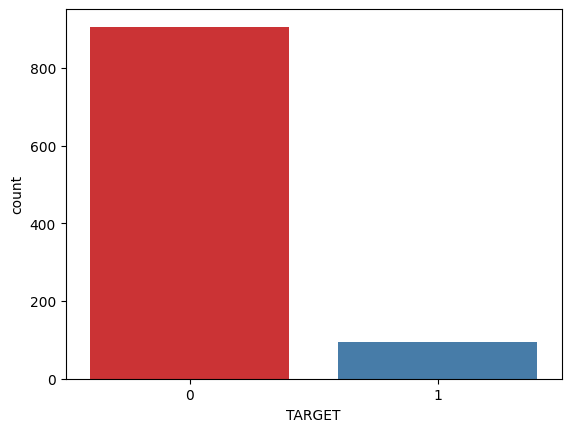

In [44]:
# Exploring Target value


sns.countplot(x='TARGET',data=Visualize_data_df,palette='Set1')




It seems that the dataset is imbalanced.There are less customers who churn, however we need to handle this using techniques like SMOTE before training the model for better accuracy.

#Analyzing each Categorical variable separately.

In [45]:
# run this cell only once
columns_that_can_be_removed.extend(['APP_EMP_TYPE', 'APP_POSITION_TYPE'])

In [46]:
columns_that_can_be_removed

['ID',
 'PRC_ACCEPTS_A_EMAIL_LINK',
 'PRC_ACCEPTS_A_POS',
 'PRC_ACCEPTS_A_TK',
 'PRC_ACCEPTS_A_AMOBILE',
 'PRC_ACCEPTS_A_MTP',
 'PRC_ACCEPTS_A_ATM',
 'PRC_ACCEPTS_MTP',
 'PRC_ACCEPTS_TK',
 'APP_EMP_TYPE',
 'APP_POSITION_TYPE']

#**Bivariate Analyses**

**Numerical Features**

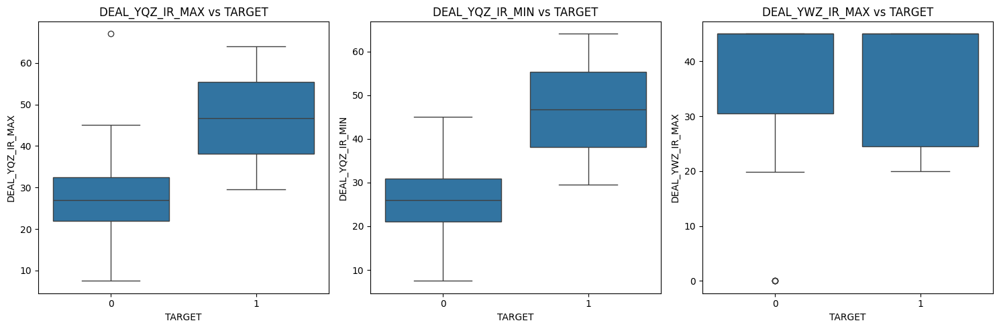

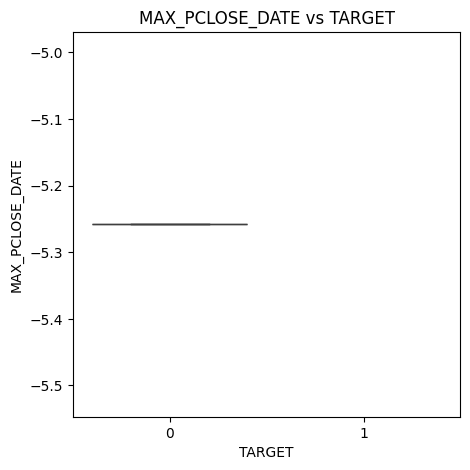

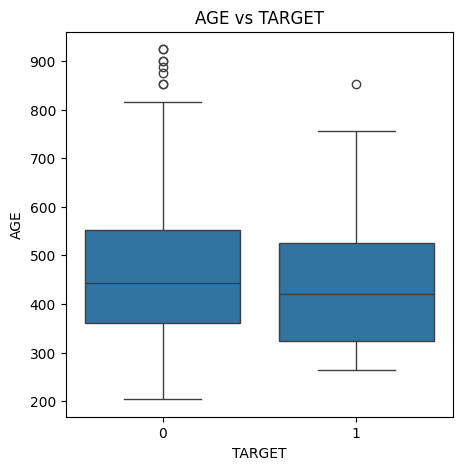

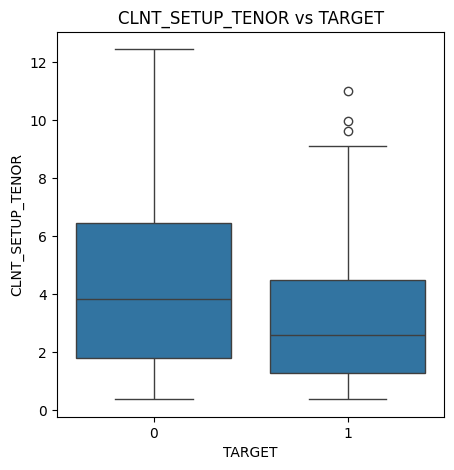

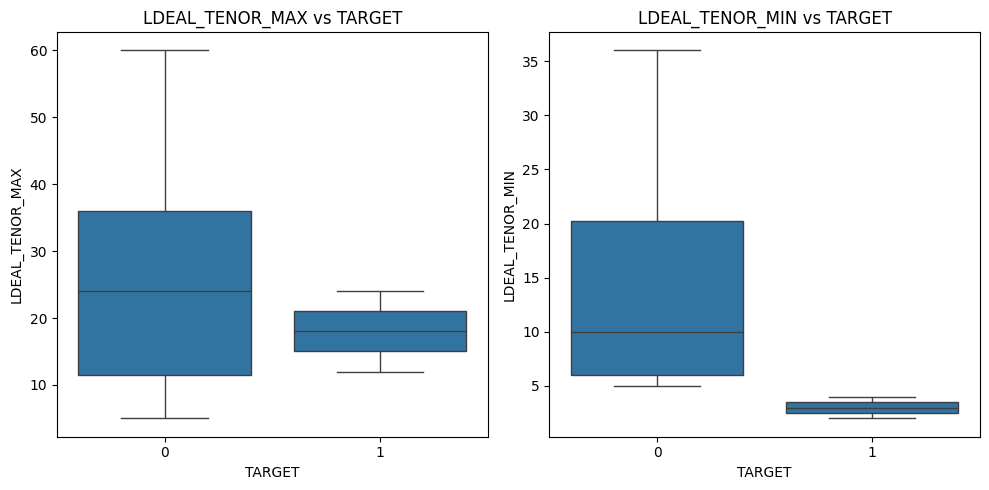

In [47]:


# 1. Interest Rates and Churn
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
sns.boxplot(x='TARGET', y='DEAL_YQZ_IR_MAX', data=Visualize_data_df)
plt.title('DEAL_YQZ_IR_MAX vs TARGET')

plt.subplot(1, 3, 2)
sns.boxplot(x='TARGET', y='DEAL_YQZ_IR_MIN', data=Visualize_data_df)
plt.title('DEAL_YQZ_IR_MIN vs TARGET')

plt.subplot(1, 3, 3)
sns.boxplot(x='TARGET', y='DEAL_YWZ_IR_MAX', data=Visualize_data_df)
plt.title('DEAL_YWZ_IR_MAX vs TARGET')

plt.tight_layout()
plt.show()

# 2. MAX_PCLOSE_DATE and Churn
plt.figure(figsize=(5, 5))
sns.boxplot(x='TARGET', y='MAX_PCLOSE_DATE', data=Visualize_data_df)
plt.title('MAX_PCLOSE_DATE vs TARGET')
plt.show()

# 3. AGE and Churn
plt.figure(figsize=(5, 5))
sns.boxplot(x='TARGET', y='AGE', data=Visualize_data_df)
plt.title('AGE vs TARGET')
plt.show()

# 4. CLNT_SETUP_TENOR and Churn
plt.figure(figsize=(5, 5))
sns.boxplot(x='TARGET', y='CLNT_SETUP_TENOR', data=Visualize_data_df)
plt.title('CLNT_SETUP_TENOR vs TARGET')
plt.show()

# 7. Deal Tenor and Churn
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='TARGET', y='LDEAL_TENOR_MAX', data=Visualize_data_df)
plt.title('LDEAL_TENOR_MAX vs TARGET')

plt.subplot(1, 2, 2)
sns.boxplot(x='TARGET', y='LDEAL_TENOR_MIN', data=Visualize_data_df)
plt.title('LDEAL_TENOR_MIN vs TARGET')



plt.tight_layout()
plt.show()


In [48]:

# Converting AGE from months to years for better readability.
churn_data_bank_df_sample['AGE'] = churn_data_bank_df_sample['AGE'] / 12


churn_data_bank_df_sample.head()


,Unnamed: 0,ID,CR_PROD_CNT_IL,AMOUNT_RUB_CLO_PRC,PRC_ACCEPTS_A_EMAIL_LINK,APP_REGISTR_RGN_CODE,PRC_ACCEPTS_A_POS,PRC_ACCEPTS_A_TK,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,PRC_ACCEPTS_A_AMOBILE,SUM_TRAN_AUT_TENDENCY3M,CLNT_TRUST_RELATION,PRC_ACCEPTS_TK,PRC_ACCEPTS_A_MTP,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,APP_MARITAL_STATUS,REST_DYNAMIC_SAVE_3M,CR_PROD_CNT_VCU,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,APP_KIND_OF_PROP_HABITATION,CLNT_JOB_POSITION_TYPE,AMOUNT_RUB_NAS_PRC,CLNT_JOB_POSITION,APP_DRIVING_LICENSE,TRANS_COUNT_SUP_PRC,APP_EDUCATION,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,PRC_ACCEPTS_A_ATM,PRC_ACCEPTS_MTP,TRANS_COUNT_NAS_PRC,APP_TRAVEL_PASS,CNT_ACCEPTS_MTP,CR_PROD_CNT_TOVR,APP_CAR,CR_PROD_CNT_PIL,SUM_TRAN_CLO_TENDENCY1M,APP_POSITION_TYPE,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,CR_PROD_CNT_CC,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,APP_EMP_TYPE,SUM_TRAN_CLO_TENDENCY3M,LDEAL_TENOR_MAX,LDEAL_YQZ_CHRG,CR_PROD_CNT_CCFP,DEAL_YQZ_IR_MAX,LDEAL_YQZ_COM,DEAL_YQZ_IR_MIN,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_TENOR_MIN,LDEAL_AMT_MONTH,APP_COMP_TYPE,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,AVG_PCT_MONTH_TO_PCLOSE,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,PACK,MAX_PCLOSE_DATE,LDEAL_YQZ_PC,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,LDEAL_DELINQ_PER_MAXYQZ,TURNOVER_DYNAMIC_PAYM_1M,CLNT_SALARY_VALUE,TRANS_AMOUNT_TENDENCY3M,MED_DEBT_PRC_YQZ,TRANS_CNT_TENDENCY3M,LDEAL_USED_AMT_AVG_YQZ,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,AVG_PCT_DEBT_TO_DEAL_AMT,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR,TARGET
0,199773,396428,0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,Not Specified,0.0,0,19224.354017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Not Specified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,NaN,NaN,0.0,NaN,NaN,0.000000,53.0,NaN,0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.428975,0.000000,NaN,NaN,NaN,0.0,0.999511,NaN,0.022873,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.984816,K01,NaN,NaN,0.705918,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
1,291058,510683,0,0.008562,NaN,NaN,NaN,NaN,0.0,0.454545,0.466258,0.112605,NaN,0.586104,NaN,NaN,NaN,0.0,0.545455,NaN,Not Specified,0.0,0,13583.624117,0.5,NaN,NaN,0.093760,Зам.директора,NaN,0.309278,Not Specified,NaN,0.761807,NaN,NaN,0.061856,NaN,NaN,0,NaN,0,NaN,NaN,0.0,0.030928,0.467086,0.000000,52.0,0.5,0,0.761807,0.0,0.0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0.278207,0.000000,NaN,NaN,NaN,0.0,0.664071,0.700000,0.016680,0.0,0.676164,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.393750,NaN,NaN,0.000000,0.466667,NaN,0.771738,O01,NaN,NaN,1.372474,NaN,0.0,NaN,0.000000,NaN,0.328504,NaN,0.762887,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
2,244966,452953,0,0.085807,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.163598,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,Not Specified,0.0,0,15546.947617,0.2,NaN,NaN,0.011177,ВИЗУАЛЬНЫЙ МЕРЧЕНДАЙЗЕР,NaN,0.317708,Not Specified,0.05,0.120993,NaN,NaN,0.015625,NaN,NaN,1,NaN,0,0.046524,NaN,0.0,0.078125,0.181442,0.000000,23.0,0.4,0,0.312795,0.0,0.0,NaN,0.578676,NaN,NaN,0,NaN,NaN,NaN,0.6,0.049805,0.000000,NaN,NaN,NaN,0.0,0.276858,0.467213,0.053592,0.0,0.459532,0.0,0.233333,NaN,0.0,0.238554,NaN,NaN,20.0,0.102013,20.0,NaN,0.000000,0.114754,NaN,0.340611,102,NaN,N

In [49]:
# Install translator
!pip install deep_translator


In [50]:
from deep_translator import GoogleTranslator

# Create a function to apply to the Russian text
def translate_text(text):
    try:
        return GoogleTranslator(src='ru', target = 'en').translate(text)
    except Exception as e:
        return text  # Return original text if translation fails

# categorical_data_df_s ['Translated_CLNT_JOB_POSITION'] = categorical_data_df_s ['CLNT_JOB_POSITION'].apply(translate_text)

In [51]:
# Apply the translator function the sample dataset
# Fill NAN with blanks to enable translation
churn_data_bank_df_sample['CLNT_JOB_POSITION'] = churn_data_bank_df_sample['CLNT_JOB_POSITION'].fillna('')

# Convert feature values to English
churn_data_bank_df_sample ['CLNT_JOB_POSITION'] = churn_data_bank_df_sample['CLNT_JOB_POSITION'].apply(translate_text)

#Analysing relationship between each categorical feature with respect to target variable.

## ***6. Feature Engineering & Data Pre-processing***

In [52]:
categorical_columns

['APP_CAR',
 'APP_COMP_TYPE',
 'APP_DRIVING_LICENSE',
 'APP_EDUCATION',
 'APP_EMP_TYPE',
 'APP_KIND_OF_PROP_HABITATION',
 'APP_MARITAL_STATUS',
 'APP_POSITION_TYPE',
 'APP_TRAVEL_PASS',
 'CLNT_JOB_POSITION',
 'CLNT_JOB_POSITION_TYPE',
 'CLNT_TRUST_RELATION',
 'PACK',
 'CR_PROD_CNT_IL',
 'CR_PROD_CNT_VCU',
 'CR_PROD_CNT_TOVR',
 'CR_PROD_CNT_PIL',
 'CR_PROD_CNT_CC',
 'CR_PROD_CNT_CCFP',
 'CNT_ACCEPTS_TK',
 'CNT_ACCEPTS_MTP']

In [53]:

from scipy.stats import chi2_contingency


# df = Feature_Engineering_churn_data_bank_df
df = churn_data_bank_df_sample



def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

#  Cramér's V for each categorical column with 'TARGET'
cramers_v_results = {}
for column in categorical_columns:
    confusion_matrix = pd.crosstab(df[column], df['TARGET'])
    cramers_v_score = cramers_v(confusion_matrix.values)
    cramers_v_results[column] = cramers_v_score

#
cramers_v_df = pd.DataFrame.from_dict(cramers_v_results, orient='index', columns=['Cramér\'s V'])
cramers_v_df.sort_values(by='Cramér\'s V', ascending=False, inplace=True)

print(cramers_v_df)


                             Cramér's V
CLNT_JOB_POSITION              0.174558
CLNT_JOB_POSITION_TYPE         0.140266
APP_KIND_OF_PROP_HABITATION    0.125933
APP_DRIVING_LICENSE            0.113917
APP_POSITION_TYPE              0.096250
CR_PROD_CNT_PIL                0.085315
CR_PROD_CNT_IL                 0.082377
APP_EMP_TYPE                   0.078407
APP_COMP_TYPE                  0.078407
CR_PROD_CNT_CC                 0.024561
CR_PROD_CNT_TOVR               0.000000
CR_PROD_CNT_VCU                0.000000
APP_CAR                        0.000000
PACK                           0.000000
CLNT_TRUST_RELATION            0.000000
APP_TRAVEL_PASS                0.000000
APP_MARITAL_STATUS             0.000000
APP_EDUCATION                  0.000000
CR_PROD_CNT_CCFP               0.000000
CNT_ACCEPTS_TK                      NaN
CNT_ACCEPTS_MTP                     NaN


In [54]:
cat_columns_to_remove = ['APP_DRIVING_LICENSE', 'APP_EMP_TYPE', 'APP_POSITION_TYPE']

In [55]:
cat_columns_to_remove.extend(cramers_v_df.index[cramers_v_df['Cramér\'s V'] < 0.1])

In [56]:
cat_columns_to_remove

['APP_DRIVING_LICENSE',
 'APP_EMP_TYPE',
 'APP_POSITION_TYPE',
 'APP_POSITION_TYPE',
 'CR_PROD_CNT_PIL',
 'CR_PROD_CNT_IL',
 'APP_EMP_TYPE',
 'APP_COMP_TYPE',
 'CR_PROD_CNT_CC',
 'CR_PROD_CNT_TOVR',
 'CR_PROD_CNT_VCU',
 'APP_CAR',
 'PACK',
 'CLNT_TRUST_RELATION',
 'APP_TRAVEL_PASS',
 'APP_MARITAL_STATUS',
 'APP_EDUCATION',
 'CR_PROD_CNT_CCFP']

In [57]:
# updating
columns_that_can_be_removed.extend(cat_columns_to_remove)

In [58]:
# percentage of missing values in numirical data
missing_percentages_numerical = numerical_data_df.isnull().sum() / len(numerical_data_df) * 100


missing_percentages_df_num = pd.DataFrame({'Column': numerical_data_df.columns, 'Missing Percentage': missing_percentages_numerical})
missing_percentages_df_num.sort_values(by='Missing Percentage', ascending=False, inplace=True)

missing_num_80=missing_percentages_df_num[missing_percentages_df_num['Missing Percentage'] > 80]

missing_percentages_df_num[missing_percentages_df_num['Missing Percentage'] > 0]


,Column,Missing Percentage
CLNT_SALARY_VALUE,CLNT_SALARY_VALUE,99.799544
LDEAL_YQZ_COM,LDEAL_YQZ_COM,99.650891
LDEAL_YQZ_CHRG,LDEAL_YQZ_CHRG,99.650610
AVG_PCT_MONTH_TO_PCLOSE,AVG_PCT_MONTH_TO_PCLOSE,99.541654
MAX_PCLOSE_DATE,MAX_PCLOSE_DATE,99.470424
LDEAL_AMT_MONTH,LDEAL_AMT_MONTH,99.468454
AVG_PCT_DEBT_TO_DEAL_AMT,AVG_PCT_DEBT_TO_DEAL_AMT,99.468454
LDEAL_YQZ_PC,LDEAL_YQZ_PC,99.209437
LDEAL_USED_AMT_AVG_YQZ,LDEAL_USED_AMT_AVG_YQZ,97.747403
LDEAL_TENOR_MIN,LDEAL_TENOR_MIN,97.747403


In [59]:
# numerical_columns_to_remove = [
#     'CLNT_SALARY_VALUE', 'LDEAL_YQZ_COM', 'LDEAL_YQZ_CHRG',
#     'AVG_PCT_MONTH_TO_PCLOSE', 'MAX_PCLOSE_DATE', 'LDEAL_AMT_MONTH',
#     'AVG_PCT_DEBT_TO_DEAL_AMT', 'LDEAL_YQZ_PC', 'LDEAL_USED_AMT_AVG_YQZ',
#     'LDEAL_TENOR_MIN', 'DEAL_YQZ_IR_MAX', 'DEAL_YQZ_IR_MIN',
#     'MED_DEBT_PRC_YQZ', 'LDEAL_TENOR_MAX', 'LDEAL_DELINQ_PER_MAXYQZ',
#     'APP_REGISTR_RGN_CODE', 'CNT_TRAN_CLO_TENDENCY1M', 'SUM_TRAN_CLO_TENDENCY1M',
#     'CNT_TRAN_MED_TENDENCY1M', 'SUM_TRAN_MED_TENDENCY1M',
#     'DEAL_GRACE_DAYS_ACC_AVG', 'DEAL_GRACE_DAYS_ACC_MAX', 'DEAL_GRACE_DAYS_ACC_S1X1'
# ]

numerical_columns_to_remove = missing_percentages_df_num.index[missing_percentages_df_num['Missing Percentage'] > 90]
numerical_columns_to_remove

Index(['CLNT_SALARY_VALUE', 'LDEAL_YQZ_COM', 'LDEAL_YQZ_CHRG',
       'AVG_PCT_MONTH_TO_PCLOSE', 'MAX_PCLOSE_DATE', 'LDEAL_AMT_MONTH',
       'AVG_PCT_DEBT_TO_DEAL_AMT', 'LDEAL_YQZ_PC', 'LDEAL_USED_AMT_AVG_YQZ',
       'LDEAL_TENOR_MIN', 'DEAL_YQZ_IR_MAX', 'DEAL_YQZ_IR_MIN',
       'MED_DEBT_PRC_YQZ', 'LDEAL_TENOR_MAX', 'LDEAL_DELINQ_PER_MAXYQZ'],
      dtype='object')

In [60]:
#updating the list
columns_that_can_be_removed.extend(numerical_columns_to_remove)

In [61]:
# removing the columns so far based on 80% missing values and analyses found from EDA

# Feature_Engineering_churn_data_bank_df.drop(columns_that_can_be_removed, axis=1, inplace=True)

# print(Feature_Engineering_churn_data_bank_df.shape)
# Feature_Engineering_churn_data_bank_df.head()

churn_data_bank_df_sample.drop(columns_that_can_be_removed, axis=1, inplace=True)
churn_data_bank_df_sample.head()


,Unnamed: 0,AMOUNT_RUB_CLO_PRC,APP_REGISTR_RGN_CODE,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,SUM_TRAN_AUT_TENDENCY3M,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,REST_DYNAMIC_SAVE_3M,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,APP_KIND_OF_PROP_HABITATION,CLNT_JOB_POSITION_TYPE,AMOUNT_RUB_NAS_PRC,CLNT_JOB_POSITION,TRANS_COUNT_SUP_PRC,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,TRANS_COUNT_NAS_PRC,CNT_ACCEPTS_MTP,SUM_TRAN_CLO_TENDENCY1M,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,SUM_TRAN_CLO_TENDENCY3M,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,TURNOVER_DYNAMIC_PAYM_1M,TRANS_AMOUNT_TENDENCY3M,TRANS_CNT_TENDENCY3M,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR,TARGET
0,199773,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,19224.354017,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.000000,53.0,NaN,NaN,0.0,0.0,NaN,NaN,0.428975,0.000000,0.0,0.999511,NaN,0.022873,0.0,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.984816,0.705918,NaN,0.0,0.000000,NaN,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
1,291058,0.008562,NaN,0.0,0.454545,0.466258,0.112605,0.586104,0.0,0.545455,NaN,0.0,13583.624117,0.5,NaN,NaN,0.093760,Deputy director,0.309278,NaN,0.761807,0.061856,NaN,NaN,0.0,0.030928,0.467086,0.000000,52.0,0.5,0.761807,0.0,0.0,NaN,NaN,0.278207,0.000000,0.0,0.664071,0.700000,0.016680,0.0,0.676164,0.0,NaN,NaN,0.0,NaN,NaN,NaN,0.393750,NaN,NaN,0.000000,0.466667,NaN,0.771738,1.372474,NaN,0.0,0.000000,0.328504,0.762887,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
2,244966,0.085807,NaN,0.0,NaN,NaN,0.163598,NaN,0.0,NaN,NaN,0.0,15546.947617,0.2,NaN,NaN,0.011177,VISUAL MERCHANDISER,0.317708,0.05,0.120993,0.015625,NaN,0.046524,0.0,0.078125,0.181442,0.000000,23.0,0.4,0.312795,0.0,0.0,0.578676,0.6,0.049805,0.000000,0.0,0.276858,0.467213,0.053592,0.0,0.459532,0.0,0.233333,NaN,0.0,0.238554,NaN,20.0,0.102013,20.0,NaN,0.000000,0.114754,NaN,0.340611,1.047205,NaN,0.0,0.000000,0.328969,0.473958,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,178164,0.000000,23.0,0.0,NaN,NaN,0.012009,NaN,0.0,NaN,0.0,0.0,0.000000,1.0,SO,SPECIALIST,0.003926,,0.157895,NaN,1.000000,0.105263,0.0,NaN,0.0,0.578947,0.977638,85194.260000,49.0,1.0,1.000000,0.0,0.0,NaN,NaN,0.000000,5308.780683,0.0,0.000000,1.000000,0.000000,1.0,1.000000,0.0,1.000000,0.272727,0.0,1.000000,NaN,NaN,1.000000,NaN,0.064257,0.109581,1.000000,NaN,0.000000,6.243553,NaN,1.0,0.040642,1.000000,1.000000,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0
4,69687,NaN,42.0,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,0.000000,NaN,SO,SPECIALIST,NaN,DRIVER,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,16666.666667,32.0,NaN,NaN,0.0,0.0,NaN,NaN,0.000000,0.000000,0.0,0.000000,NaN,0.000000,0.0,NaN,0.0,NaN,NaN,0.0,NaN,0.0,19.9,NaN,45.0,NaN,0.000000,NaN,0.0,0.000000,4.738184,0.0,1.0,1.000000,NaN,NaN,0.0,1.0,0.0,0.299388,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0


#**Work with below dataset and variables.**

Dataset Name - **Fchurn_data_bank_df_sample**

All Numerical_columns - **updated_numerical_columns**

All Categorical_columns - **updated_categorical_columns**

In [62]:
# Ft_Eng_churn_data_bank_df.shape
churn_data_bank_df_sample.shape


(1000, 77)

In [63]:
missing_percentages_df_cat[missing_percentages_df_cat['Missing Percentage'] > 0]

,Column,Missing Percentage
CLNT_JOB_POSITION_TYPE,CLNT_JOB_POSITION_TYPE,87.392382
APP_CAR,APP_CAR,83.880177
APP_DRIVING_LICENSE,APP_DRIVING_LICENSE,83.879895
APP_TRAVEL_PASS,APP_TRAVEL_PASS,83.879895
APP_KIND_OF_PROP_HABITATION,APP_KIND_OF_PROP_HABITATION,83.287536
APP_POSITION_TYPE,APP_POSITION_TYPE,82.954194
APP_EMP_TYPE,APP_EMP_TYPE,81.034939
APP_COMP_TYPE,APP_COMP_TYPE,81.034939
APP_EDUCATION,APP_EDUCATION,80.826037
APP_MARITAL_STATUS,APP_MARITAL_STATUS,80.789437


#**Data split**

In [64]:

# #Spliting the dataset - Train (80%) - Test (20%)
# x_train_dummy, x_test, y_train_dummy, y_test = train_test_split(Ft_Eng_churn_data_bank_df.drop(['TARGET'],axis=1), Ft_Eng_churn_data_bank_df['TARGET'], test_size=0.1, random_state=42)
# print(x_train_dummy.shape)
# print(x_test.shape)
# print(y_train_dummy.shape)
# print(y_test.shape)

X_train, X_test, y_train, y_test = train_test_split(churn_data_bank_df_sample.drop(['TARGET'],axis=1), churn_data_bank_df_sample['TARGET'], test_size=0.1, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(900, 76)
(100, 76)
(900,)
(100,)


###Handling Missing values

In [65]:
# Updating categorical columns
categorical_columns = churn_data_bank_df_sample.select_dtypes(include=['object']).columns
categorical_columns

Index(['APP_KIND_OF_PROP_HABITATION', 'CLNT_JOB_POSITION_TYPE',
       'CLNT_JOB_POSITION'],
      dtype='object')

In [66]:
X_train[categorical_columns].isnull().sum()

APP_KIND_OF_PROP_HABITATION    760
CLNT_JOB_POSITION_TYPE         800
CLNT_JOB_POSITION                0
dtype: int64

In [67]:
# Replace blanks in APP_KIND_OF_PROP_HABITATION with mode
# X_train['APP_KIND_OF_PROP_HABITATION'].value_counts()
replacer_tr = X_train['APP_KIND_OF_PROP_HABITATION'].mode()[0]
replacer_te = X_test['APP_KIND_OF_PROP_HABITATION'].mode()[0]
X_train['APP_KIND_OF_PROP_HABITATION'].fillna(value = replacer_tr, inplace=True)
X_test['APP_KIND_OF_PROP_HABITATION'].fillna(value = replacer_te, inplace=True)

In [68]:
# Replace blanks in CLNT_JOB_POSITION_TYPE with mode
# X_train['CLNT_JOB_POSITION_TYPE'].value_counts()
replacer_tr = X_train['CLNT_JOB_POSITION_TYPE'].mode()[0]
replacer_te = X_test['CLNT_JOB_POSITION_TYPE'].mode()[0]
X_train['CLNT_JOB_POSITION_TYPE'].fillna(value = replacer_tr, inplace=True)
X_test['CLNT_JOB_POSITION_TYPE'].fillna(value = replacer_te, inplace=True)

In [69]:
# Make the characters in CLNT_JOB_POSITION' uppercase
X_train['CLNT_JOB_POSITION'] = X_train['CLNT_JOB_POSITION'].str.upper()
X_test['CLNT_JOB_POSITION'] = X_test['CLNT_JOB_POSITION'].str.upper()

In [70]:
from math import nan
# Replace blanks in CLNT_JOB_POSITION with mode - since we made the NAs blank
X_train['CLNT_JOB_POSITION'].replace("", nan, inplace=True)
X_test['CLNT_JOB_POSITION'].replace("", nan, inplace=True)

# Then replace NaN with mode

# X_train['CLNT_JOB_POSITION_TYPE'].value_counts()
replacer_tr = X_train['CLNT_JOB_POSITION'].mode()[0]
replacer_te = X_test['CLNT_JOB_POSITION'].mode()[0]
X_train['CLNT_JOB_POSITION'].fillna(value = replacer_tr, inplace=True)
X_test['CLNT_JOB_POSITION'].fillna(value = replacer_te, inplace=True)



In [71]:
numerical_columns = [col for col in churn_data_bank_df_sample.select_dtypes(include=['float64', 'int64']).columns if col != 'TARGET']
missing_numerical_columns = X_train[numerical_columns].isnull().sum()
missing_cols_names = missing_numerical_columns[missing_numerical_columns > 0].index.tolist()
print(missing_cols_names)

['AMOUNT_RUB_CLO_PRC', 'APP_REGISTR_RGN_CODE', 'CNT_TRAN_AUT_TENDENCY1M', 'SUM_TRAN_AUT_TENDENCY1M', 'AMOUNT_RUB_SUP_PRC', 'SUM_TRAN_AUT_TENDENCY3M', 'CNT_TRAN_AUT_TENDENCY3M', 'CNT_ACCEPTS_TK', 'CNT_TRAN_MED_TENDENCY1M', 'AMOUNT_RUB_NAS_PRC', 'TRANS_COUNT_SUP_PRC', 'CNT_TRAN_CLO_TENDENCY1M', 'SUM_TRAN_MED_TENDENCY1M', 'TRANS_COUNT_NAS_PRC', 'CNT_ACCEPTS_MTP', 'SUM_TRAN_CLO_TENDENCY1M', 'TRANS_COUNT_ATM_PRC', 'AMOUNT_RUB_ATM_PRC', 'CNT_TRAN_MED_TENDENCY3M', 'SUM_TRAN_MED_TENDENCY3M', 'SUM_TRAN_CLO_TENDENCY3M', 'CNT_TRAN_CLO_TENDENCY3M', 'CNT_TRAN_SUP_TENDENCY3M', 'SUM_TRAN_SUP_TENDENCY3M', 'CNT_TRAN_ATM_TENDENCY3M', 'CNT_TRAN_ATM_TENDENCY1M', 'SUM_TRAN_ATM_TENDENCY3M', 'DEAL_GRACE_DAYS_ACC_S1X1', 'DEAL_YWZ_IR_MIN', 'SUM_TRAN_SUP_TENDENCY1M', 'DEAL_YWZ_IR_MAX', 'SUM_TRAN_ATM_TENDENCY1M', 'CNT_TRAN_SUP_TENDENCY1M', 'DEAL_GRACE_DAYS_ACC_AVG', 'DEAL_GRACE_DAYS_ACC_MAX', 'TRANS_AMOUNT_TENDENCY3M', 'TRANS_CNT_TENDENCY3M', 'LDEAL_USED_AMT_AVG_YWZ', 'LDEAL_ACT_DAYS_ACC_PCT_AVG', 'MED_DEBT_PRC_

In [72]:
# Imputing all missing values of numerical columns with median
for col in missing_cols_names:
    median_tr = X_train[col].median()
    median_te = X_test[col].median()
    X_train[col].fillna(median_tr, inplace=True)
    X_test[col].fillna(median_te, inplace=True)

In [73]:
# # Create a dictionary for mapping
# education_mapping = {
#     'Not Specified': 'No Degree',
#     'High School': 'No Degree',
#     'Some School': 'No Degree',
#     'Undergraduate': 'Degree',
#     'Secondary School': 'No Degree',
#     'Higher Education': 'Degree',
#     'Incomplete Higher': 'No Degree',
#     'Associate Degree': 'Degree',
#     'Elementary': 'No Degree',
#     'Academic Degree': 'Degree',
#     'Advanced Degree': 'Degree'
# }

# # mapping to the 'APP_EDUCATION' column
# x_train_dummy['APP_EDUCATION'] = x_train_dummy['APP_EDUCATION'].map(education_mapping)
# x_test['APP_EDUCATION'] = x_test['APP_EDUCATION'].map(education_mapping)


# print(x_train_dummy['APP_EDUCATION'].value_counts())

### Categorical Encoding

In [74]:
len(X_train[categorical_columns])

900

In [75]:
print(X_test.shape, end=" ")
print(X_train.shape, end=" ")

(100, 76) (900, 76) 

In [76]:
# using One hot Encoding

from sklearn.preprocessing import OneHotEncoder


# Initializing the OneHotEncoder
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')

# Fittin the encoder on the training data and transform both the training and test data
encoded_train = ohe.fit_transform(X_train[categorical_columns])
# Get encoded_train columns
encoded_train_columns = ohe.get_feature_names_out(categorical_columns)

encoded_test = ohe.transform(X_test[categorical_columns])
# Get encoded_test columns
encoded_test_columns = ohe.get_feature_names_out(categorical_columns)




# Convert the encoded features to DataFrames
encoded_train_df = pd.DataFrame(encoded_train, columns= encoded_train_columns)

encoded_test_df = pd.DataFrame(encoded_test, columns= encoded_test_columns)

# encoded_train_df.shape


# Concatenate the original DataFrames with the encoded DataFrames
x_train_df = pd.concat([X_train.reset_index(drop=True).drop(categorical_columns, axis=1), encoded_train_df], axis=1)

x_test_df = pd.concat([X_test.reset_index(drop=True).drop(categorical_columns, axis=1), encoded_test_df], axis=1)


x_train_df.head()



,Unnamed: 0,AMOUNT_RUB_CLO_PRC,APP_REGISTR_RGN_CODE,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,SUM_TRAN_AUT_TENDENCY3M,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,REST_DYNAMIC_SAVE_3M,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,AMOUNT_RUB_NAS_PRC,TRANS_COUNT_SUP_PRC,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,TRANS_COUNT_NAS_PRC,CNT_ACCEPTS_MTP,SUM_TRAN_CLO_TENDENCY1M,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,SUM_TRAN_CLO_TENDENCY3M,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,TURNOVER_DYNAMIC_PAYM_1M,TRANS_AMOUNT_TENDENCY3M,TRANS_CNT_TENDENCY3M,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR,APP_KIND_OF_PROP_HABITATION_JO,APP_KIND_OF_PROP_HABITATION_NPRIVAT,APP_KIND_OF_PROP_HABITATION_OTHER,APP_KIND_OF_PROP_HABITATION_RENT,APP_KIND_OF_PROP_HABITATION_SO,CLNT_JOB_POSITION_TYPE_MANAGER,CLNT_JOB_POSITION_TYPE_SELF_EMPL,CLNT_JOB_POSITION_TYPE_SPECIALIST,CLNT_JOB_POSITION_TYPE_TOP_MANAGER,CLNT_JOB_POSITION_1ST CLASS OPERATOR,CLNT_JOB_POSITION_2ND MATE,CLNT_JOB_POSITION_A LAWYER,CLNT_JOB_POSITION_A SPECIALIST,CLNT_JOB_POSITION_A STUDENT,CLNT_JOB_POSITION_ACCOUNTANT,CLNT_JOB_POSITION_ACCOUNTANT OF THE MATERIAL GROUP,CLNT_JOB_POSITION_ADJUSTMENT ENGINEER,CLNT_JOB_POSITION_ADMINISTRATOR,CLNT_JOB_POSITION_ADVERTISING SPECIALIST,CLNT_JOB_POSITION_ANALYST SPECIALIST,CLNT_JOB_POSITION_ANALYTICS,CLNT_JOB_POSITION_APPARATUS OPERATOR,CLNT_JOB_POSITION_ARCHITECT,CLNT_JOB_POSITION_ART DIRECTOR,CLNT_JOB_POSITION_ART MANAGER,CLNT_JOB_POSITION_ASSEMBLER,CLNT_JOB_POSITION_ASSISTANT DIESEL LOGO TECHNICIAN,CLNT_JOB_POSITION_ASSISTANT DIRECTOR,CLNT_JOB_POSITION_ASSISTANT GENERAL DIRECTOR,CLNT_JOB_POSITION_ASSISTANT MANAGER,CLNT_JOB_POSITION_ASSISTANT TO THE PRESIDENT,CLNT_JOB_POSITION_ASSOCIATE PROFESSOR OF THE DEPARTMENT,CLNT_JOB_POSITION_AUDITOR,CLNT_JOB_POSITION_AUTO MECHANIC,CLNT_JOB_POSITION_BRANCH MANAGER,CLNT_JOB_POSITION_BRAND MANAGER,CLNT_JOB_POSITION_BRIGADIER,CLNT_JOB_POSITION_CASHIER,CLNT_JOB_POSITION_CEO,CLNT_JOB_POSITION_CFO,CLNT_JOB_POSITION_CH. ACCOUNTANT,CLNT_JOB_POSITION_CHIEF ACCOUNTANT,CLNT_JOB_POSITION_CHIEF EDITOR,CLNT_JOB_POSITION_CHIEF ENGINEER,CLNT_JOB_POSITION_CHIEF PHYSICIAN,CLNT_JOB_POSITION_CHIEF SPECIALIST,CLNT_JOB_POSITION_CHOREOGRAPHER,CLNT_JOB_POSITION_COM. DIRECTOR,CLNT_JOB_POSITION_COMMERCIAL DIRECTOR,CLNT_JOB_POSITION_COMMERCIAL MANAGER,CLNT_JOB_POSITION_COMMITTEE COORDINATOR,CLNT_JOB_POSITION_CONCERT MASTER,CLNT_JOB_POSITION_CONFIGURATION SPECIALIST,CLNT_JOB_POSITION_CONSTRUCTION DIRECTOR,CLNT_JOB_POSITION_CONSULTANT,CLNT_JOB_POSITION_CONSULTING PHYSICIAN,CLNT_JOB_POSITION_COOK,CLNT_JOB_POSITION_COURIER,CLNT_JOB_POSITION_CREATIVE DIRECTOR,CLNT_JOB_POSITION_DENTIST,CLNT_JOB_POSITION_DEPARTMENT DIRECTOR,CLNT_JOB_POSITION_DEPARTMENT HEAD,CLNT_JOB_POSITION_DEPUTY BEGINNING DEPARTMENTS,CLNT_JOB_POSITION_DEPUTY CHIEF ACCOUNTANT,CLNT_JOB_POSITION_DEPUTY CHIEF ENGINEER,CLNT_JOB_POSITION_DEPUTY COMMERCIAL DIRECTOR,CLNT_JOB_POSITION_DEPUTY DIRECTOR,CLNT_JOB_POSITION_DEPUTY DIRECTOR FOR CONSTRUCTION,CLNT_JOB_POSITION_DEPUTY DIRECTOR FOR CORPORATE BUSINESS,CLNT_JOB_POSITION_DEPUTY DIRECTOR FOR FIN

In [77]:
x_train_smote=x_train_df.copy()
x_train_undersample=x_train_df.copy()
y_train_smote=y_train.copy()
y_train_undersample=y_train.copy()

If using smote work with above dataframes

In [78]:
# dataset is imbalanced
y_train_smote.value_counts()

TARGET
0    814
1     86
Name: count, dtype: int64

###  Handling Imbalanced Dataset

SMOTE (Synthetic Minority Over-sampling Technique) is a data augmentation technique used in machine learning to address the problem of class imbalance.

Class imbalance occurs when the distribution of the classes in the dataset is not balanced, and one class has significantly fewer samples than the other class.

SMOTE works by synthesizing new samples from the minority class, creating a balanced dataset. It does this by selecting a minority class sample and finding its k-nearest neighbors (k is a user-defined parameter). The new synthetic samples are created by interpolating between the selected minority class sample and its k-nearest neighbors.

In [79]:
 '''
#SMOTE
import imblearn
from imblearn.over_sampling import SMOTE
smote = SMOTE()
x_train_smote, y_train_smote=smote.fit_resample(x_train_smote, y_train_smote)
'''

'\n#SMOTE\nimport imblearn\nfrom imblearn.over_sampling import SMOTE\nsmote = SMOTE()\nx_train_smote, y_train_smote=smote.fit_resample(x_train_smote, y_train_smote)\n'

In [80]:
y_train_smote.value_counts()

TARGET
0    814
1     86
Name: count, dtype: int64

**Undersampling**

In [81]:

from imblearn.under_sampling import RandomUnderSampler


undersample = RandomUnderSampler(sampling_strategy=1.0, random_state=42)


x_train_undersample, y_train_undersample = undersample.fit_resample(x_train_undersample, y_train_undersample)


In [82]:
y_train_undersample.value_counts()

TARGET
0    86
1    86
Name: count, dtype: int64

In [83]:
x_scaled_smote=x_train_smote.copy()
x_test_scaled_smote=x_test_df.copy()
x_scaled_undersampled=x_train_undersample.copy()
x_test_scaled_undersampled=x_test_df.copy()

In [84]:
x_scaled_undersampled.shape

(172, 311)

###  Data Scaling

In [85]:

# Scaling your data
scaler= StandardScaler()
# columns_to_scale = updated_numerical_columns
columns_to_scale = numerical_columns

# Fit and transform the selected columns using the StandardScaler
x_scaled_undersampled[columns_to_scale] = scaler.fit_transform(x_scaled_undersampled[columns_to_scale])

# Transform the test data using the same scaler
x_test_scaled_undersampled[columns_to_scale] = scaler.transform(x_test_scaled_undersampled[columns_to_scale])

x_scaled_undersampled.head()



,Unnamed: 0,AMOUNT_RUB_CLO_PRC,APP_REGISTR_RGN_CODE,TURNOVER_DYNAMIC_IL_1M,CNT_TRAN_AUT_TENDENCY1M,SUM_TRAN_AUT_TENDENCY1M,AMOUNT_RUB_SUP_PRC,SUM_TRAN_AUT_TENDENCY3M,REST_DYNAMIC_FDEP_1M,CNT_TRAN_AUT_TENDENCY3M,CNT_ACCEPTS_TK,REST_DYNAMIC_SAVE_3M,REST_AVG_CUR,CNT_TRAN_MED_TENDENCY1M,AMOUNT_RUB_NAS_PRC,TRANS_COUNT_SUP_PRC,CNT_TRAN_CLO_TENDENCY1M,SUM_TRAN_MED_TENDENCY1M,TRANS_COUNT_NAS_PRC,CNT_ACCEPTS_MTP,SUM_TRAN_CLO_TENDENCY1M,TURNOVER_CC,TRANS_COUNT_ATM_PRC,AMOUNT_RUB_ATM_PRC,TURNOVER_PAYM,AGE,CNT_TRAN_MED_TENDENCY3M,SUM_TRAN_MED_TENDENCY3M,REST_DYNAMIC_FDEP_3M,REST_DYNAMIC_IL_1M,SUM_TRAN_CLO_TENDENCY3M,CNT_TRAN_CLO_TENDENCY3M,REST_DYNAMIC_CUR_1M,REST_AVG_PAYM,LDEAL_GRACE_DAYS_PCT_MED,REST_DYNAMIC_CUR_3M,CNT_TRAN_SUP_TENDENCY3M,TURNOVER_DYNAMIC_CUR_1M,REST_DYNAMIC_PAYM_3M,SUM_TRAN_SUP_TENDENCY3M,REST_DYNAMIC_IL_3M,CNT_TRAN_ATM_TENDENCY3M,CNT_TRAN_ATM_TENDENCY1M,TURNOVER_DYNAMIC_IL_3M,SUM_TRAN_ATM_TENDENCY3M,DEAL_GRACE_DAYS_ACC_S1X1,DEAL_YWZ_IR_MIN,SUM_TRAN_SUP_TENDENCY1M,DEAL_YWZ_IR_MAX,SUM_TRAN_ATM_TENDENCY1M,REST_DYNAMIC_PAYM_1M,CNT_TRAN_SUP_TENDENCY1M,DEAL_GRACE_DAYS_ACC_AVG,TURNOVER_DYNAMIC_CUR_3M,CLNT_SETUP_TENOR,DEAL_GRACE_DAYS_ACC_MAX,TURNOVER_DYNAMIC_PAYM_3M,TURNOVER_DYNAMIC_PAYM_1M,TRANS_AMOUNT_TENDENCY3M,TRANS_CNT_TENDENCY3M,REST_DYNAMIC_CC_1M,LDEAL_USED_AMT_AVG_YWZ,TURNOVER_DYNAMIC_CC_1M,LDEAL_ACT_DAYS_ACC_PCT_AVG,REST_DYNAMIC_CC_3M,MED_DEBT_PRC_YWZ,LDEAL_ACT_DAYS_PCT_TR3,LDEAL_ACT_DAYS_PCT_AAVG,LDEAL_DELINQ_PER_MAXYWZ,TURNOVER_DYNAMIC_CC_3M,LDEAL_ACT_DAYS_PCT_TR,LDEAL_ACT_DAYS_PCT_TR4,LDEAL_ACT_DAYS_PCT_CURR,APP_KIND_OF_PROP_HABITATION_JO,APP_KIND_OF_PROP_HABITATION_NPRIVAT,APP_KIND_OF_PROP_HABITATION_OTHER,APP_KIND_OF_PROP_HABITATION_RENT,APP_KIND_OF_PROP_HABITATION_SO,CLNT_JOB_POSITION_TYPE_MANAGER,CLNT_JOB_POSITION_TYPE_SELF_EMPL,CLNT_JOB_POSITION_TYPE_SPECIALIST,CLNT_JOB_POSITION_TYPE_TOP_MANAGER,CLNT_JOB_POSITION_1ST CLASS OPERATOR,CLNT_JOB_POSITION_2ND MATE,CLNT_JOB_POSITION_A LAWYER,CLNT_JOB_POSITION_A SPECIALIST,CLNT_JOB_POSITION_A STUDENT,CLNT_JOB_POSITION_ACCOUNTANT,CLNT_JOB_POSITION_ACCOUNTANT OF THE MATERIAL GROUP,CLNT_JOB_POSITION_ADJUSTMENT ENGINEER,CLNT_JOB_POSITION_ADMINISTRATOR,CLNT_JOB_POSITION_ADVERTISING SPECIALIST,CLNT_JOB_POSITION_ANALYST SPECIALIST,CLNT_JOB_POSITION_ANALYTICS,CLNT_JOB_POSITION_APPARATUS OPERATOR,CLNT_JOB_POSITION_ARCHITECT,CLNT_JOB_POSITION_ART DIRECTOR,CLNT_JOB_POSITION_ART MANAGER,CLNT_JOB_POSITION_ASSEMBLER,CLNT_JOB_POSITION_ASSISTANT DIESEL LOGO TECHNICIAN,CLNT_JOB_POSITION_ASSISTANT DIRECTOR,CLNT_JOB_POSITION_ASSISTANT GENERAL DIRECTOR,CLNT_JOB_POSITION_ASSISTANT MANAGER,CLNT_JOB_POSITION_ASSISTANT TO THE PRESIDENT,CLNT_JOB_POSITION_ASSOCIATE PROFESSOR OF THE DEPARTMENT,CLNT_JOB_POSITION_AUDITOR,CLNT_JOB_POSITION_AUTO MECHANIC,CLNT_JOB_POSITION_BRANCH MANAGER,CLNT_JOB_POSITION_BRAND MANAGER,CLNT_JOB_POSITION_BRIGADIER,CLNT_JOB_POSITION_CASHIER,CLNT_JOB_POSITION_CEO,CLNT_JOB_POSITION_CFO,CLNT_JOB_POSITION_CH. ACCOUNTANT,CLNT_JOB_POSITION_CHIEF ACCOUNTANT,CLNT_JOB_POSITION_CHIEF EDITOR,CLNT_JOB_POSITION_CHIEF ENGINEER,CLNT_JOB_POSITION_CHIEF PHYSICIAN,CLNT_JOB_POSITION_CHIEF SPECIALIST,CLNT_JOB_POSITION_CHOREOGRAPHER,CLNT_JOB_POSITION_COM. DIRECTOR,CLNT_JOB_POSITION_COMMERCIAL DIRECTOR,CLNT_JOB_POSITION_COMMERCIAL MANAGER,CLNT_JOB_POSITION_COMMITTEE COORDINATOR,CLNT_JOB_POSITION_CONCERT MASTER,CLNT_JOB_POSITION_CONFIGURATION SPECIALIST,CLNT_JOB_POSITION_CONSTRUCTION DIRECTOR,CLNT_JOB_POSITION_CONSULTANT,CLNT_JOB_POSITION_CONSULTING PHYSICIAN,CLNT_JOB_POSITION_COOK,CLNT_JOB_POSITION_COURIER,CLNT_JOB_POSITION_CREATIVE DIRECTOR,CLNT_JOB_POSITION_DENTIST,CLNT_JOB_POSITION_DEPARTMENT DIRECTOR,CLNT_JOB_POSITION_DEPARTMENT HEAD,CLNT_JOB_POSITION_DEPUTY BEGINNING DEPARTMENTS,CLNT_JOB_POSITION_DEPUTY CHIEF ACCOUNTANT,CLNT_JOB_POSITION_DEPUTY CHIEF ENGINEER,CLNT_JOB_POSITION_DEPUTY COMMERCIAL DIRECTOR,CLNT_JOB_POSITION_DEPUTY DIRECTOR,CLNT_JOB_POSITION_DEPUTY DIRECTOR FOR CONSTRUCTION,CLNT_JOB_POSITION_DEPUTY DIRECTOR FOR CORPORATE BUSINESS,CLNT_JOB_POSITION_DEPUTY DIRECTOR FOR FIN

In [86]:
'''
# Scaling your data
scaler= StandardScaler()
columns_to_scale = updated_numerical_columns

# Fit and transform the selected columns using the StandardScaler
x_scaled_smote[columns_to_scale] = scaler.fit_transform(x_scaled_smote[columns_to_scale])

# Transform the test data using the same scaler
x_test_scaled_smote[columns_to_scale] = scaler.transform(x_test_scaled_smote[columns_to_scale])

x_scaled_smote.head()
'''

'\n# Scaling your data\nscaler= StandardScaler()\ncolumns_to_scale = updated_numerical_columns\n\n# Fit and transform the selected columns using the StandardScaler\nx_scaled_smote[columns_to_scale] = scaler.fit_transform(x_scaled_smote[columns_to_scale])\n\n# Transform the test data using the same scaler\nx_test_scaled_smote[columns_to_scale] = scaler.transform(x_test_scaled_smote[columns_to_scale])\n\nx_scaled_smote.head()\n'

In [87]:
x_train=x_scaled_undersampled.copy()
x_test=x_test_scaled_undersampled.copy()
y_train=y_train_undersample.copy()
y_test=y_test

In [88]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(172, 311)
(100, 311)
(172,)
(100,)


## ***ML Model Implementation***

### ML Model - 1

#Logistic Regression

Logistic Regression is a widely used statistical classification algorithm that is commonly used for binary classification problems, where the target variable (dependent variable) has two classes, usually represented as 0 and 1. It is a part of the generalized linear model family and is based on the logistic function (also known as the sigmoid function).

The logistic function maps any real-valued number to a value between 0 and 1, making it suitable for binary classification. If the output of the logistic function is greater than or equal to 0.5, the model predicts the positive class (1), otherwise, it predicts the negative class (0).

In [89]:
# ML Model - 1 Implementation
LR = LogisticRegression()

# Fitting the Training dataset into the model
LR.fit(x_train, y_train)

# Predicting using the Testing Features

y_train_pred=LR.predict(x_train)
y_test_pred =LR.predict(x_test)




In [90]:
comparision_LR = pd.DataFrame(zip(y_test, y_test_pred), columns = ['actual', 'pred'])
comparision_LR.head()

,actual,pred
0,0,0
1,0,1
2,0,1
3,0,1
4,0,1


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

recall for train data is 0.872
recall for test data is 0.375
precision for train data is 0.815
precision for test data is 0.054
accuracy for train data is 0.837
accuracu for test data is 0.42
The f1 score is 0.094
The AUC score is 0.30978260869565216.

classification_report
              precision    recall  f1-score   support

           0       0.89      0.42      0.57        92
           1       0.05      0.38      0.09         8

    accuracy                           0.42       100
   macro avg       0.47      0.40      0.33       100
weighted avg       0.82      0.42      0.54       100


[[39 53]
 [ 5  3]]


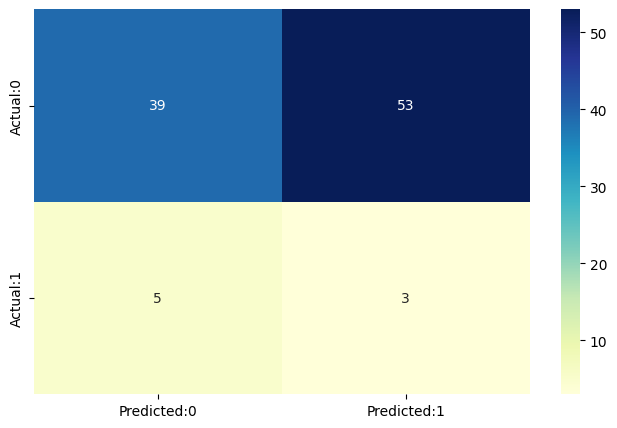

In [91]:
# Visualizing evaluation Metric Score chart
from sklearn.metrics import confusion_matrix
#Recall Score for train and test
train_recall_LR = recall_score(y_train, y_train_pred)
test_recall_LR = recall_score(y_test, y_test_pred)
print(f"recall for train data is {round(train_recall_LR,3)}")
print(f"recall for test data is {round(test_recall_LR,3)}")

#Printing the precision of the model
train_precision_LR = round(precision_score(y_train,y_train_pred), 3)
test_precision_LR = round(precision_score(y_test,y_test_pred), 3)
print(f"precision for train data is {round(train_precision_LR,3)}")
print(f"precision for test data is {round(test_precision_LR,3)}")


#Printing the accuracy of the model
train_accuracy_LR = accuracy_score(y_train,y_train_pred)
test_accuracy_LR = accuracy_score(y_test,y_test_pred)
print(f"accuracy for train data is {round(train_accuracy_LR,3)}")
print(f"accuracu for test data is {round(test_accuracy_LR,3)}")




#f1 score for logistic regression
f1_LR = f1_score(y_test, y_test_pred)
print(f'The f1 score is {round(f1_LR,3)}')


# ROC curve and AUC
probs_LR= LR.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs_LR = probs_LR[:, 1]
# calculate AUC
auc_LR = roc_auc_score(y_test, probs_LR)
print(f"The AUC score is {auc_LR}.")


#Displaying the Classification Report
print()
print("classification_report")
print(classification_report(y_test,y_test_pred))




#Plotting the Confusion Matrix
cm=confusion_matrix(y_test,y_test_pred)
conf_matrix_LR=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix_LR, annot=True,fmt='d',cmap="YlGnBu")

print()
print(cm)


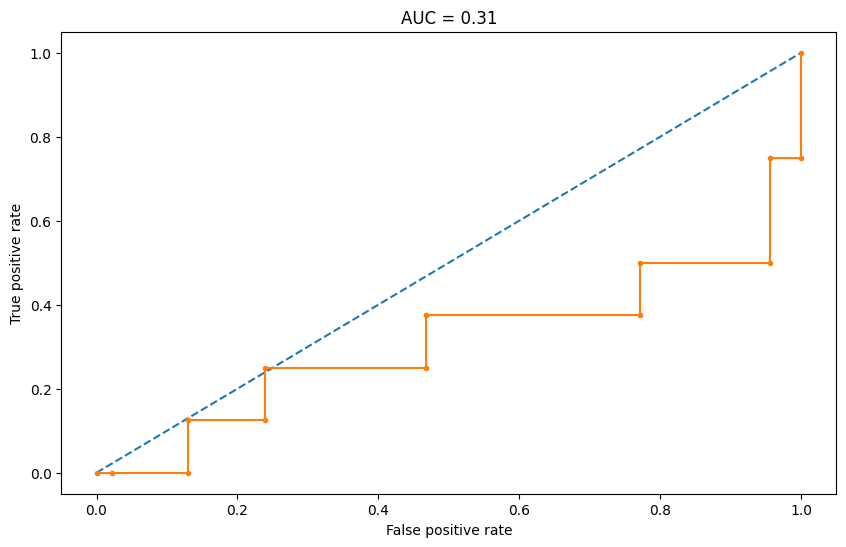

KS statistic: 0.010869565217391297


In [92]:
# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs_LR)
# plot curve

plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(auc_LR,3)}")
plt.show()

#KS (Kolmogorov-Smirnov) Statistic:
from sklearn import metrics
def ks_statistic(y_true, y_score):
    fpr, tpr, thresholds = metrics.roc_curve(y_true, y_score)
    return max(tpr - fpr)

ks_LR = ks_statistic(y_test, LR.predict_proba(x_test)[:, 1])

print("KS statistic:", ks_LR)


In [93]:
Logistic_regession_metrics = {'Recall_train':train_recall_LR,'Recall':test_recall_LR,'Precision_train' : train_precision_LR,'Precision' : test_precision_LR,'Accuracy_train' : train_accuracy_LR,'Accuracy' : test_accuracy_LR,'F1_score' : f1_LR,'ROC_AUC_score' : auc_LR,'KS_statistic':ks_LR }
metric = pd.DataFrame.from_dict(Logistic_regession_metrics, orient='index').reset_index()
metric = metric.rename(columns={'index':'Metric',0:'Logistic_Regession'})
metric

,Metric,Logistic_Regession
0,Recall_train,0.872093
1,Recall,0.375000
2,Precision_train,0.815000
3,Precision,0.054000
4,Accuracy_train,0.837209
5,Accuracy,0.420000
6,F1_score,0.093750
7,ROC_AUC_score,0.309783
8,KS_statistic,0.010870


#### 2. Cross- Validation & Hyperparameter Tuning

In [94]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Define the hyperparameters to tune
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'class_weight': [{0:1, 1:1}]
}







LR_tuned = LogisticRegression()

# Fit the Algorithm

gs_LR= GridSearchCV(estimator=LR_tuned, param_grid=param_grid, scoring='f1', cv=5)
gs_LR.fit(x_train, y_train)


# Predict on the model
y_train_pred_gs_LR = gs_LR.predict(x_train)
y_test_pred_gs_LR = gs_LR.predict(x_test)



# Print the best hyperparameters and the corresponding score
print("Best Hyperparameters:")
print(gs_LR.best_params_)
print("Best Score: ", gs_LR.best_score_)


Best Hyperparameters:
{'C': 0.01, 'class_weight': {0: 1, 1: 1}, 'penalty': 'l2'}
Best Score:  0.5992150933327404


recall for train data is 0.744
recall for test data is 0.75
precision for train data is 0.696
precision for test data is 0.136
accuracy for train data is 0.709
accuracu for test data is 0.6
The f1 score is 0.231
The AUC score is 0.6086956521739131.

classification_report
              precision    recall  f1-score   support

           0       0.96      0.59      0.73        92
           1       0.14      0.75      0.23         8

    accuracy                           0.60       100
   macro avg       0.55      0.67      0.48       100
weighted avg       0.90      0.60      0.69       100


[[54 38]
 [ 2  6]]


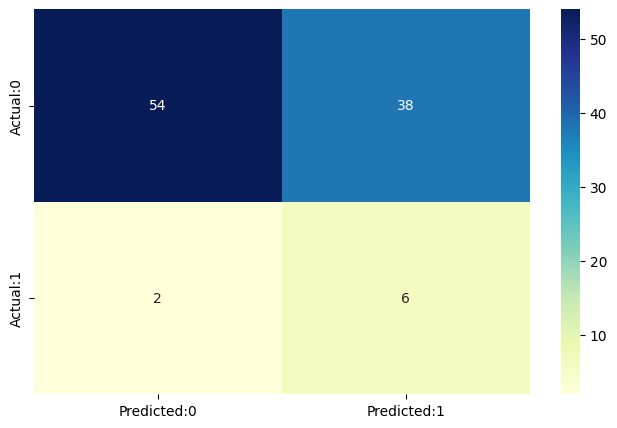

In [95]:
# Visualizing evaluation Metric Score chart

#Recall Score for train and test
train_recall_gs_LR = recall_score(y_train, y_train_pred_gs_LR)
test_recall_gs_LR = recall_score(y_test, y_test_pred_gs_LR)
print(f"recall for train data is {round(train_recall_gs_LR,3)}")
print(f"recall for test data is {round(test_recall_gs_LR,3)}")

#Printing the precision of the model
train_precision_gs_LR = round(precision_score(y_train,y_train_pred_gs_LR), 3)
test_precision_gs_LR = round(precision_score(y_test,y_test_pred_gs_LR), 3)
print(f"precision for train data is {round(train_precision_gs_LR,3)}")
print(f"precision for test data is {round(test_precision_gs_LR,3)}")


#Printing the accuracy of the model
train_accuracy_gs_LR = accuracy_score(y_train,y_train_pred_gs_LR)
test_accuracy_gs_LR = accuracy_score(y_test,y_test_pred_gs_LR)
print(f"accuracy for train data is {round(train_accuracy_gs_LR,3)}")
print(f"accuracu for test data is {round(test_accuracy_gs_LR,3)}")




#f1 score for logistic regression
f1_gs_LR = f1_score(y_test, y_test_pred_gs_LR)
print(f'The f1 score is {round(f1_gs_LR,3)}')


# ROC curve and AUC
probs_LR_gs= gs_LR.predict_proba(x_test)
# keep probabilities for the positive outcome only
probs_LR_gs = probs_LR_gs[:, 1]
# calculate AUC
auc_gs_LR = roc_auc_score(y_test, probs_LR_gs)
print(f"The AUC score is {auc_gs_LR}.")


#Displaying the Classification Report
print()
print("classification_report")
print(classification_report(y_test,y_test_pred_gs_LR))




#Plotting the Confusion Matrix
cm=confusion_matrix(y_test,y_test_pred_gs_LR)
conf_matrix_gs_LR=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix_gs_LR, annot=True,fmt='d',cmap="YlGnBu")

print()
print(cm)


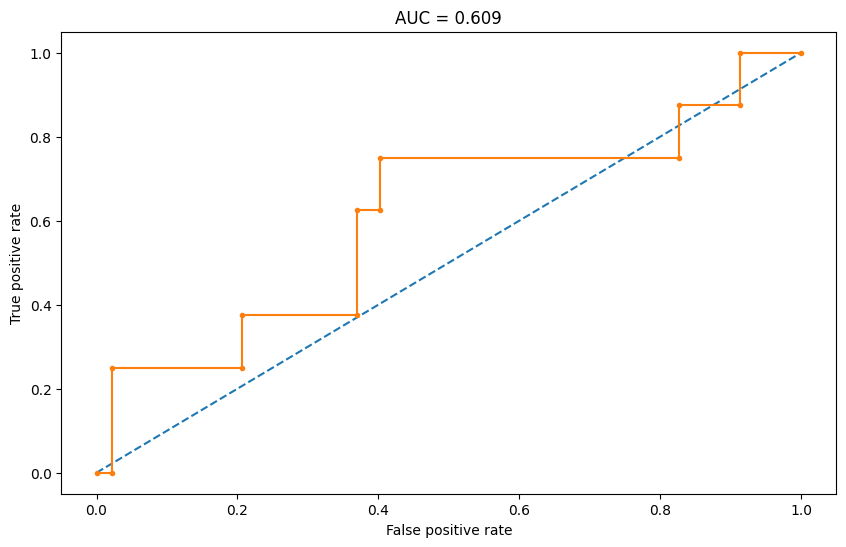

KS statistic: 0.34782608695652173


In [96]:
# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs_LR_gs)
# plot curve

plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(auc_gs_LR,3)}")
plt.show()

#KS (Kolmogorov-Smirnov) Statistic:
from sklearn import metrics
def ks_statistic_gs_LR(y_true, y_score):
    fpr, tpr, thresholds = metrics.roc_curve(y_true, y_score)
    return max(tpr - fpr)

ks_gs_LR = ks_statistic_gs_LR(y_test, gs_LR.predict_proba(x_test)[:, 1])

print("KS statistic:", ks_gs_LR)


In [97]:
metric['LR_Tuned'] = [train_recall_gs_LR,test_recall_gs_LR, train_precision_gs_LR,test_precision_gs_LR, train_accuracy_gs_LR,test_accuracy_gs_LR, f1_gs_LR, auc_gs_LR,ks_gs_LR]
metric

,Metric,Logistic_Regession,LR_Tuned
0,Recall_train,0.872093,0.744186
1,Recall,0.375000,0.750000
2,Precision_train,0.815000,0.696000
3,Precision,0.054000,0.136000
4,Accuracy_train,0.837209,0.709302
5,Accuracy,0.420000,0.600000
6,F1_score,0.093750,0.230769
7,ROC_AUC_score,0.309783,0.608696
8,KS_statistic,0.010870,0.347826


In [98]:
'''
import pickle
logistic_model=gs_LR.best_estimator_
filename = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/logistic_model.pkl'
pickle.dump(logistic_model, open(filename, 'wb'))
'''


"\nimport pickle\nlogistic_model=gs_LR.best_estimator_\nfilename = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/logistic_model.pkl'\npickle.dump(logistic_model, open(filename, 'wb'))\n"

In [99]:
pip install lime

In [100]:
import lime
import lime.lime_tabular





explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_train.values,
    feature_names=x_train.columns,
    class_names=['Not Churn', 'Churn'],
    mode='classification'
)


for i in range(3):  # Displaying 3 local explanations
    exp = explainer.explain_instance(
        data_row=x_test.iloc[i].values,
        predict_fn=gs_LR.predict_proba
    )
    exp.show_in_notebook(show_table=True)
    # For saving the plot as an image:
    exp.save_to_file(f'lime_explanation_{i}.html')


In [101]:

# Global Feature Importance
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_train.values,
    feature_names=x_train.columns.tolist(),
    class_names=['Not Churn', 'Churn'],
    mode='classification'
)


all_explanations = []
for i in range(100):
    exp = explainer.explain_instance(
        data_row=x_test.iloc[i].values,
        predict_fn=gs_LR.predict_proba
    )
    all_explanations.append(exp)

# Aggregating feature importances from all local explanations
feature_importance = {}
for exp in all_explanations:
    for feature, weight in exp.as_list():
        if feature in feature_importance:
            feature_importance[feature] += abs(weight)
        else:
            feature_importance[feature] = abs(weight)


feature_importance_df = pd.DataFrame(
    list(feature_importance.items()), columns=['Feature', 'Importance'])
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

#global feature importances
print(feature_importance_df)




                                       Feature  Importance
0                         TURNOVER_CC <= -0.08   11.584481
1                REST_DYNAMIC_FDEP_3M <= -0.08    9.316030
2                  REST_DYNAMIC_CC_1M <= -0.11    9.294179
4                  REST_DYNAMIC_CC_3M <= -0.11    9.014735
3                REST_DYNAMIC_FDEP_1M <= -0.08    8.995194
7              TURNOVER_DYNAMIC_IL_1M <= -0.08    6.563817
6                  REST_DYNAMIC_IL_3M <= -0.08    6.443524
5                  REST_DYNAMIC_IL_1M <= -0.08    6.361796
8              TURNOVER_DYNAMIC_IL_3M <= -0.08    6.227285
11                 APP_REGISTR_RGN_CODE > 0.13    1.413672
12            LDEAL_ACT_DAYS_PCT_CURR <= -0.08    1.317090
9               LDEAL_ACT_DAYS_PCT_TR <= -0.08    1.223111
10             LDEAL_ACT_DAYS_PCT_TR4 <= -0.08    1.031203
20                     MED_DEBT_PRC_YWZ > 0.00    0.486937
14                         TURNOVER_CC > -0.08    0.239576
16                  REST_DYNAMIC_CC_3M > -0.11    0.1732

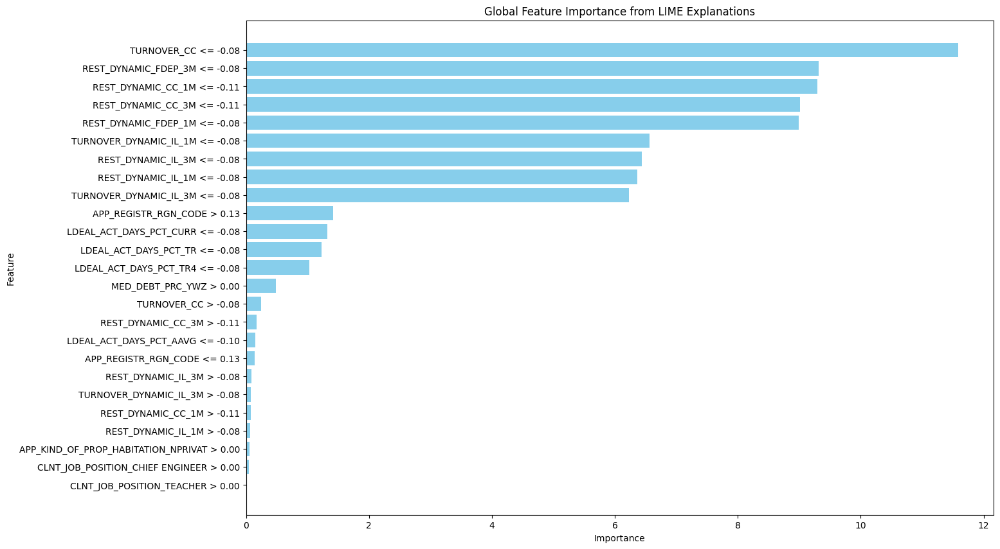

In [102]:
# Plotting the global feature importances

plt.figure(figsize=(15, 10))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Global Feature Importance from LIME Explanations')
plt.gca().invert_yaxis()
plt.show()

#**Logistic_model -2**

In [103]:
feature_importance.keys()

dict_keys(['TURNOVER_CC <= -0.08', 'REST_DYNAMIC_FDEP_3M <= -0.08', 'REST_DYNAMIC_CC_1M <= -0.11', 'REST_DYNAMIC_FDEP_1M <= -0.08', 'REST_DYNAMIC_CC_3M <= -0.11', 'REST_DYNAMIC_IL_1M <= -0.08', 'REST_DYNAMIC_IL_3M <= -0.08', 'TURNOVER_DYNAMIC_IL_1M <= -0.08', 'TURNOVER_DYNAMIC_IL_3M <= -0.08', 'LDEAL_ACT_DAYS_PCT_TR <= -0.08', 'LDEAL_ACT_DAYS_PCT_TR4 <= -0.08', 'APP_REGISTR_RGN_CODE > 0.13', 'LDEAL_ACT_DAYS_PCT_CURR <= -0.08', 'APP_REGISTR_RGN_CODE <= 0.13', 'TURNOVER_CC > -0.08', 'REST_DYNAMIC_IL_3M > -0.08', 'REST_DYNAMIC_CC_3M > -0.11', 'TURNOVER_DYNAMIC_IL_3M > -0.08', 'REST_DYNAMIC_IL_1M > -0.08', 'LDEAL_ACT_DAYS_PCT_AAVG <= -0.10', 'MED_DEBT_PRC_YWZ > 0.00', 'REST_DYNAMIC_CC_1M > -0.11', 'CLNT_JOB_POSITION_TEACHER > 0.00', 'APP_KIND_OF_PROP_HABITATION_NPRIVAT > 0.00', 'CLNT_JOB_POSITION_CHIEF ENGINEER > 0.00'])

In [104]:
selected_features = ['TURNOVER_CC', 'REST_DYNAMIC_FDEP_1M', 'TURNOVER_DYNAMIC_IL_1M', 'REST_DYNAMIC_CC_1M',
                     'TURNOVER_DYNAMIC_IL_3M', 'REST_DYNAMIC_CC_3M', 'REST_DYNAMIC_FDEP_3M',
                     'REST_DYNAMIC_IL_3M', 'REST_DYNAMIC_IL_1M', 'APP_REGISTR_RGN_CODE', 'LDEAL_ACT_DAYS_PCT_TR4',
                      'LDEAL_ACT_DAYS_PCT_TR', 'LDEAL_ACT_DAYS_PCT_CURR', 'LDEAL_ACT_DAYS_PCT_AAVG',
                     'TURNOVER_CC', 'REST_DYNAMIC_CC_3M', 'TURNOVER_DYNAMIC_IL_3M', 'REST_DYNAMIC_IL_3M',
                     'REST_DYNAMIC_IL_1M', 'MED_DEBT_PRC_YWZ', 'REST_DYNAMIC_CC_1M', 'CLNT_JOB_POSITION_TEACHER',
                     'APP_KIND_OF_PROP_HABITATION_NPRIVAT', 'LDEAL_ACT_DAYS_PCT_AAVG', 'CLNT_JOB_POSITION_CHIEF ENGINEER',
                     'CLNT_JOB_POSITION_A LAWYER']
# selected_features = [
#     'REST_DYNAMIC_IL_3M', 'REST_DYNAMIC_FDEP_3M', 'REST_AVG_CUR',
#     'LDEAL_ACT_DAYS_PCT_AAVG', 'CR_PROD_CNT_IL_5',
#     'CR_PROD_CNT_CCFP_2', 'REST_DYNAMIC_CUR_1M', 'DEAL_YWZ_IR_MAX',
#     'CR_PROD_CNT_TOVR_5', 'CR_PROD_CNT_CC_3', 'CR_PROD_CNT_IL_6',
#     'PACK_109', 'REST_DYNAMIC_CC_1M', 'REST_AVG_CUR', 'CR_PROD_CNT_CC_9',
#     'CR_PROD_CNT_TOVR_11', 'CR_PROD_CNT_CC_4', 'CR_PROD_CNT_PIL_4',
#     'CR_PROD_CNT_TOVR_4', 'LDEAL_GRACE_DAYS_PCT_MED', 'CR_PROD_CNT_IL_4',
#     'TURNOVER_DYNAMIC_IL_1M', 'CR_PROD_CNT_VCU_2', 'PACK_101',
#     'CR_PROD_CNT_VCU_3', 'APP_COMP_TYPE_INTER', 'CR_PROD_CNT_PIL_3',
#     'REST_AVG_PAYM', 'CR_PROD_CNT_TOVR_6', 'TURNOVER_DYNAMIC_CUR_1M',
#     'REST_AVG_CUR', 'LDEAL_DELINQ_PER_MAXYWZ', 'TRANS_COUNT_ATM_PRC',
#     'TURNOVER_DYNAMIC_IL_3M', 'LDEAL_ACT_DAYS_PCT_TR3', 'TURNOVER_DYNAMIC_CC_1M',
#     'CR_PROD_CNT_IL_3', 'REST_DYNAMIC_PAYM_1M', 'CR_PROD_CNT_TOVR_3',
#     'APP_COMP_TYPE_IP', 'REST_AVG_PAYM', 'REST_DYNAMIC_FDEP_3M',
#     'CLNT_JOB_POSITION_TYPE_SELF_EMPL', 'CR_PROD_CNT_CC_2',
#     'REST_DYNAMIC_PAYM_1M', 'CR_PROD_CNT_CCFP_1', 'APP_MARITAL_STATUS_Civil Union'
# ]


In [105]:
# Filterring the training and test sets to include only the selected features
x_train_combined = x_train[selected_features]
x_test_combined = x_test[selected_features]

In [106]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Define the hyperparameters to tune
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'class_weight': [{0:1, 1:1}]
}







LR_tuned = LogisticRegression()

# Fit the Algorithm

gs_LR= GridSearchCV(estimator=LR_tuned, param_grid=param_grid, scoring='f1', cv=5)
gs_LR.fit(x_train_combined, y_train)


# Predict on the model
y_train_pred_gs_LR = gs_LR.predict(x_train_combined)
y_test_pred_gs_LR = gs_LR.predict(x_test_combined)



# Print the best hyperparameters and the corresponding score
print("Best Hyperparameters:")
print(gs_LR.best_params_)
print("Best Score: ", gs_LR.best_score_)


Best Hyperparameters:
{'C': 0.001, 'class_weight': {0: 1, 1: 1}, 'penalty': 'l2'}
Best Score:  0.35455987795575894


recall for train data is 0.14
recall for test data is 0.25
precision for train data is 0.667
precision for test data is 0.222
accuracy for train data is 0.535
accuracu for test data is 0.87
The f1 score is 0.235
The AUC score is 0.6032608695652174.

classification_report
              precision    recall  f1-score   support

           0       0.93      0.92      0.93        92
           1       0.22      0.25      0.24         8

    accuracy                           0.87       100
   macro avg       0.58      0.59      0.58       100
weighted avg       0.88      0.87      0.87       100


[[85  7]
 [ 6  2]]


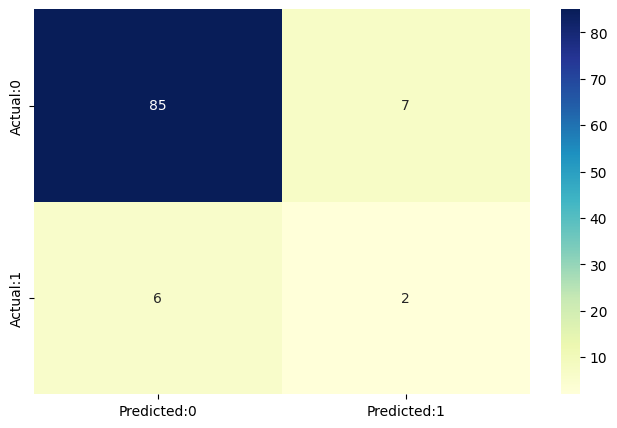

In [107]:
# Visualizing evaluation Metric Score chart
from sklearn.metrics import confusion_matrix

#Recall Score for train and test
train_recall_gs_LR = recall_score(y_train, y_train_pred_gs_LR)
test_recall_gs_LR = recall_score(y_test, y_test_pred_gs_LR)
print(f"recall for train data is {round(train_recall_gs_LR,3)}")
print(f"recall for test data is {round(test_recall_gs_LR,3)}")

#Printing the precision of the model
train_precision_gs_LR = round(precision_score(y_train,y_train_pred_gs_LR), 3)
test_precision_gs_LR = round(precision_score(y_test,y_test_pred_gs_LR), 3)
print(f"precision for train data is {round(train_precision_gs_LR,3)}")
print(f"precision for test data is {round(test_precision_gs_LR,3)}")


#Printing the accuracy of the model
train_accuracy_gs_LR = accuracy_score(y_train,y_train_pred_gs_LR)
test_accuracy_gs_LR = accuracy_score(y_test,y_test_pred_gs_LR)
print(f"accuracy for train data is {round(train_accuracy_gs_LR,3)}")
print(f"accuracu for test data is {round(test_accuracy_gs_LR,3)}")




#f1 score for logistic regression
f1_gs_LR = f1_score(y_test, y_test_pred_gs_LR)
print(f'The f1 score is {round(f1_gs_LR,3)}')


# ROC curve and AUC
probs_LR_gs= gs_LR.predict_proba(x_test_combined)
# keep probabilities for the positive outcome only
probs_LR_gs = probs_LR_gs[:, 1]
# calculate AUC
auc_gs_LR = roc_auc_score(y_test, probs_LR_gs)
print(f"The AUC score is {auc_gs_LR}.")


#Displaying the Classification Report
print()
print("classification_report")
print(classification_report(y_test,y_test_pred_gs_LR))




#Plotting the Confusion Matrix
cm=confusion_matrix(y_test,y_test_pred_gs_LR)
conf_matrix_gs_LR=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix_gs_LR, annot=True,fmt='d',cmap="YlGnBu")

print()
print(cm)


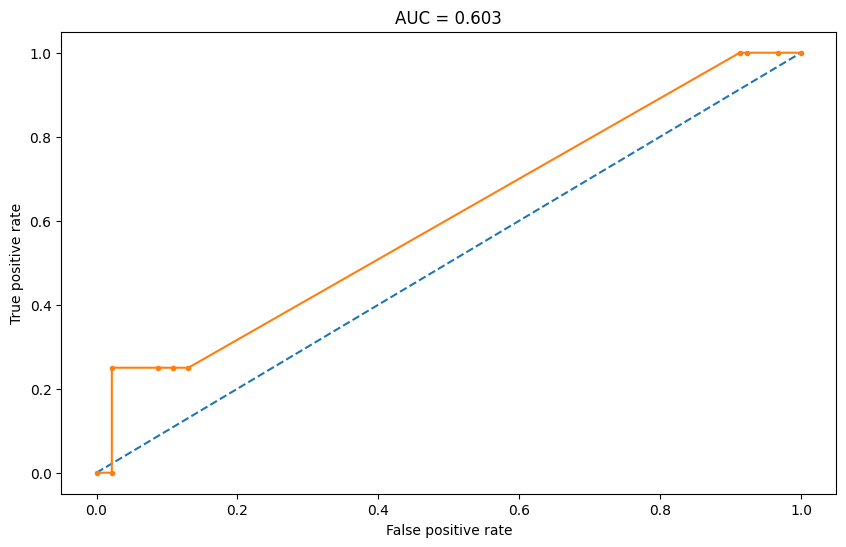

KS statistic: 0.2282608695652174


In [108]:
# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs_LR_gs)
# plot curve

plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(auc_gs_LR,3)}")
plt.show()

#KS (Kolmogorov-Smirnov) Statistic:
from sklearn import metrics
def ks_statistic_gs_LR(y_true, y_score):
    fpr, tpr, thresholds = metrics.roc_curve(y_true, y_score)
    return max(tpr - fpr)

ks_gs_LR = ks_statistic_gs_LR(y_test, gs_LR.predict_proba(x_test_combined)[:, 1])

print("KS statistic:", ks_gs_LR)


In [109]:
metrics_dict = {
    'Metric': ['Train Recall', 'Test Recall', 'Train Precision', 'Test Precision',
               'Train Accuracy', 'Test Accuracy', 'F1 Score', 'AUC Score', 'KS Score'],
    'LR_Tuned': [train_recall_gs_LR, test_recall_gs_LR, train_precision_gs_LR, test_precision_gs_LR,
                 train_accuracy_gs_LR, test_accuracy_gs_LR, f1_gs_LR, auc_gs_LR, ks_gs_LR]
}


metric_df_selected_features = pd.DataFrame(metrics_dict)


metric_df_selected_features

,Metric,LR_Tuned
0,Train Recall,0.139535
1,Test Recall,0.250000
2,Train Precision,0.667000
3,Test Precision,0.222000
4,Train Accuracy,0.534884
5,Test Accuracy,0.870000
6,F1 Score,0.235294
7,AUC Score,0.603261
8,KS Score,0.228261


In [110]:
'''
import pickle
filename = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/logistic_model_sf.pkl'
pickle.dump(gs_LR, open(filename, 'wb'))
'''

"\nimport pickle\nfilename = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/logistic_model_sf.pkl'\npickle.dump(gs_LR, open(filename, 'wb'))\n"

#**Sensivity Analyses**

In [111]:
'''
pip install SALib
'''

'\npip install SALib\n'

In [112]:
'''
from re import X

from SALib.sample import saltelli
from SALib.analyze import sobol



problem = {
    'num_vars': x_train.shape[1],
    'names': x_train.columns.tolist(),
    'bounds': [[x_train[col].min(), x_train[col].max()] for col in x_train.columns]
}


param_values = saltelli.sample(problem, 1000)


def evaluate_model(params):
    x_train_sampled = x_train.copy()
    for i, col in enumerate(x_train.columns):
        x_train_sampled[col] = params[:, i]

    gs_LR.fit(x_train_sampled, y_train)
    y_pred = gs_LR.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

Y = np.zeros([param_values.shape[0]])

for i, params in enumerate(param_values):
    x_sampled = x_train.sample(n=len(y_train), replace=True, random_state=i)
    for j, col in enumerate(x_train.columns):
        x_sampled[col] = params[j]
    gs_LR.fit(x_sampled, y_train)
    y_pred = gs_LR.predict(x_test)
    Y[i] = accuracy_score(y_test, y_pred)

#  Sobol sensitivity analysis
Si = sobol.analyze(problem, Y)


print("Sobol Sensitivity Analysis")
print("S1:", Si['S1'])
print("S1_conf:", Si['S1_conf'])
print("ST:", Si['ST'])
print("ST_conf:", Si['ST_conf'])




# S1
plt.figure(figsize=(12, 6))
plt.bar(x_train.columns, Si['S1'], yerr=Si['S1_conf'])
plt.title('First Order Sobol Sensitivity Indices')
plt.ylabel('S1')
plt.xlabel('Features')
plt.xticks(rotation=90)
plt.show()

# ST
plt.figure(figsize=(12, 6))
plt.bar(x_train.columns, Si['ST'], yerr=Si['ST_conf'])
plt.title('Total Order Sobol Sensitivity Indices')
plt.ylabel('ST')
plt.xlabel('Features')
plt.xticks(rotation=90)
plt.show()
'''

'\nfrom re import X\n\nfrom SALib.sample import saltelli\nfrom SALib.analyze import sobol\n\n\n\nproblem = {\n    \'num_vars\': x_train.shape[1],\n    \'names\': x_train.columns.tolist(),\n    \'bounds\': [[x_train[col].min(), x_train[col].max()] for col in x_train.columns]\n}\n\n\nparam_values = saltelli.sample(problem, 1000)\n\n\ndef evaluate_model(params):\n    x_train_sampled = x_train.copy()\n    for i, col in enumerate(x_train.columns):\n        x_train_sampled[col] = params[:, i]\n\n    gs_LR.fit(x_train_sampled, y_train)\n    y_pred = gs_LR.predict(x_test)\n    accuracy = accuracy_score(y_test, y_pred)\n\n    return accuracy\n\nY = np.zeros([param_values.shape[0]])\n\nfor i, params in enumerate(param_values):\n    x_sampled = x_train.sample(n=len(y_train), replace=True, random_state=i)\n    for j, col in enumerate(x_train.columns):\n        x_sampled[col] = params[j]\n    gs_LR.fit(x_sampled, y_train)\n    y_pred = gs_LR.predict(x_test)\n    Y[i] = accuracy_score(y_test, y_pred

### ML Model -2

#Support Vector Machine

A Support Vector Machine (SVM) is a type of machine learning model that is commonly used for classification and regression analysis.SVM aims to find the optimal hyperplane that best separates the two classes (defaulters and non-defaulters) in our feature space. By maximizing the margin between the classes, SVM effectively handles non-linear decision boundaries and works well with high-dimensional data. It is especially useful when dealing with imbalanced datasets, like ours, as it focuses on correctly classifying positive instances (defaulters). SVM's ability to generalize well to new data makes it a valuable model for predicting credit card defaulters with high accuracy and recall.

In [113]:
# ML Model -  Implementation


#Defining svm object
svm = SVC(kernel='rbf',probability=True,class_weight={0:1.25,1:1})





# Fit the Algorithm
svm.fit(x_train_combined, y_train)

# Predict on the model
y_train_pred_svm = svm.predict(x_train_combined)
y_test_pred_svm=svm.predict(x_test_combined)

In [114]:
'''

import pickle
filename = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/SVM_sf.pkl'
pickle.dump(svm, open(filename, 'wb'))
'''

"\n\nimport pickle\nfilename = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/SVM_sf.pkl'\npickle.dump(svm, open(filename, 'wb'))\n"

recall for train data is 0.105
recall for test data is 0.25
precision for train data is 0.692
precision for test data is 0.4
accuracy for train data is 0.529
accuracu for test data is 0.91
The f1 score is 0.182
The f1 score is 0.308
The AUC score is 0.53125.

classification_report
              precision    recall  f1-score   support

           0       0.94      0.97      0.95        92
           1       0.40      0.25      0.31         8

    accuracy                           0.91       100
   macro avg       0.67      0.61      0.63       100
weighted avg       0.89      0.91      0.90       100


[[89  3]
 [ 6  2]]


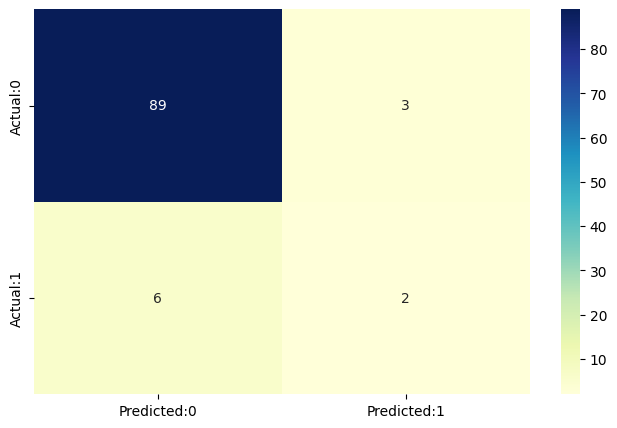

In [115]:
# Visualizing evaluation Metric Score chart

#Recall Score for train and test
train_recall_svm = recall_score(y_train, y_train_pred_svm)
test_recall_svm = recall_score(y_test, y_test_pred_svm)
print(f"recall for train data is {round(train_recall_svm,3)}")
print(f"recall for test data is {round(test_recall_svm,3)}")

#Printing the precision of the model
train_precision_svm = round(precision_score(y_train,y_train_pred_svm), 3)
test_precision_svm= round(precision_score(y_test,y_test_pred_svm), 3)
print(f"precision for train data is {round(train_precision_svm,3)}")
print(f"precision for test data is {round(test_precision_svm,3)}")


#Printing the accuracy of the model
train_accuracy_svm = accuracy_score(y_train,y_train_pred_svm)
test_accuracy_svm= accuracy_score(y_test,y_test_pred_svm)
print(f"accuracy for train data is {round(train_accuracy_svm,3)}")
print(f"accuracu for test data is {round(test_accuracy_svm,3)}")




#f1 score for logistic regression
f1_train= f1_score(y_train, y_train_pred_svm)
print(f'The f1 score is {round(f1_train,3)}')

f1_svm = f1_score(y_test, y_test_pred_svm)
print(f'The f1 score is {round(f1_svm,3)}')




# ROC curve and AUC
probs_svm= svm.predict_proba(x_test_combined)

# keep probabilities for the positive outcome only
probs_svm =probs_svm[:, 1]

# calculate AUC

auc_svm = roc_auc_score(y_test, probs_svm)
print(f"The AUC score is {auc_svm}.")


#Displaying the Classification Report
print()
print("classification_report")
print(classification_report(y_test,y_test_pred_svm))




#Plotting the Confusion Matrix
cm=confusion_matrix(y_test,y_test_pred_svm)
conf_matrix_svm=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix_svm, annot=True,fmt='d',cmap="YlGnBu")

print()
print(cm)


1. It can bee seen that, model is able to predict good number of true positives(people who might churn) but also falsely predicting more users as churn customers eventhough they do not with 78% confidence.

2. We can give more weight to 0's and can see if false positives will drop or not. Eventhough, as a business perspective if identifying all churn customers is more important even at the cost of falsely identifying churn customers, then our model is doing good by identifying 80% of all the true churn customers.

3. There is a room for improvement, need to do feature engineering where focus can be on churn customers.

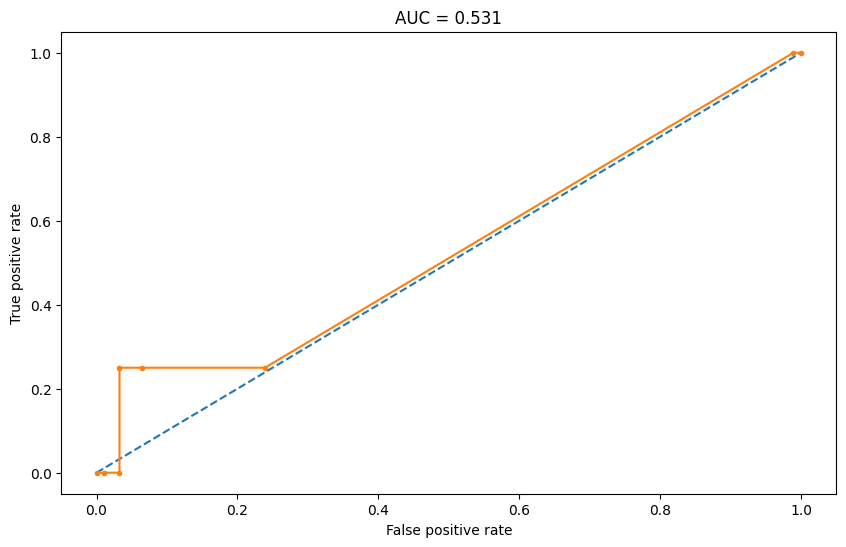

KS statistic: 0.21739130434782608


In [116]:
# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs_svm)
# plot curve

plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(auc_svm,3)}")
plt.show()

#KS (Kolmogorov-Smirnov) Statistic:
from sklearn import metrics
def ks_statistic_svm(y_true, y_score):
    fpr, tpr, thresholds = metrics.roc_curve(y_true, y_score)
    return max(tpr - fpr)

ks_svm = ks_statistic_svm(y_test, svm.predict_proba(x_test_combined)[:, 1])

print("KS statistic:", ks_svm)


In [117]:
metric_df_selected_features['SVM'] = [train_recall_svm,test_recall_svm,train_precision_svm, test_precision_svm, train_accuracy_svm,test_accuracy_svm, f1_svm, auc_svm,ks_svm]
metric_df_selected_features

,Metric,LR_Tuned,SVM
0,Train Recall,0.139535,0.104651
1,Test Recall,0.250000,0.250000
2,Train Precision,0.667000,0.692000
3,Test Precision,0.222000,0.400000
4,Train Accuracy,0.534884,0.529070
5,Test Accuracy,0.870000,0.910000
6,F1 Score,0.235294,0.307692
7,AUC Score,0.603261,0.531250
8,KS Score,0.228261,0.217391


In [118]:
'''
import pickle

svm=pickle.load(open('/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/SVM_sf.pkl', 'rb'))

'''

"\nimport pickle\n\nsvm=pickle.load(open('/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/SVM_sf.pkl', 'rb'))\n\n"

In [119]:
pip install lime

In [120]:
#creating new copy of my datasets
x_shap_train=x_train.copy()
x_shap_test=x_test.copy()
y_train_shap=y_train.copy()
y_test_shap=y_test.copy()

In [121]:
print(x_shap_train.shape)
print(x_shap_test.shape)
print(y_train_shap.shape)
print(y_test_shap.shape)

(172, 311)
(100, 311)
(172,)
(100,)


In [122]:
import lime
import lime.lime_tabular



# Sampling 100 data points for Lime analysis
sample_size = 100
x_sample = x_train_combined.sample(n=sample_size, random_state=42)
y_sample = y_train.sample(n=sample_size, random_state=42)

x_sample_test = x_test_combined.sample(n=sample_size, random_state=42)
y_sample_test = y_test.sample(n=sample_size, random_state=42)









#**Local Feature Importance using Lime**

In [123]:
import lime
import lime.lime_tabular





explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_sample.values,
    feature_names=x_sample.columns,
    class_names=['Not Churn', 'Churn'],
    mode='classification'
)


for i in range(3):  # Displaying 3 local explanations
    exp = explainer.explain_instance(
        data_row=x_sample_test.iloc[i].values,
        predict_fn=svm.predict_proba
    )
    exp.show_in_notebook(show_table=True)
    # For saving the plot as an image:
    exp.save_to_file(f'lime_explanation_{i}.html')


#**Global Features**

In [124]:

# Global Feature Importance
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_sample.values,
    feature_names=x_sample.columns.tolist(),
    class_names=['Not Churn', 'Churn'],
    mode='classification'
)


all_explanations = []
for i in range(10):
    exp = explainer.explain_instance(
        data_row=x_sample_test.iloc[i].values,
        predict_fn=svm.predict_proba
    )
    all_explanations.append(exp)

# Aggregating feature importances from all local explanations
feature_importance = {}
for exp in all_explanations:
    for feature, weight in exp.as_list():
        if feature in feature_importance:
            feature_importance[feature] += abs(weight)
        else:
            feature_importance[feature] = abs(weight)


feature_importance_df = pd.DataFrame(
    list(feature_importance.items()), columns=['Feature', 'Importance'])
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

#global feature importances
print(feature_importance_df)




                            Feature  Importance
0       REST_DYNAMIC_IL_1M <= -0.08    0.324462
1       REST_DYNAMIC_IL_3M <= -0.08    0.323926
4              TURNOVER_CC <= -0.08    0.321039
3   TURNOVER_DYNAMIC_IL_3M <= -0.08    0.316628
2   TURNOVER_DYNAMIC_IL_1M <= -0.08    0.162361
5    LDEAL_ACT_DAYS_PCT_TR <= -0.08    0.070285
7   LDEAL_ACT_DAYS_PCT_TR4 <= -0.08    0.023375
6  LDEAL_ACT_DAYS_PCT_CURR <= -0.08    0.011235
8  LDEAL_ACT_DAYS_PCT_AAVG <= -0.10    0.010587


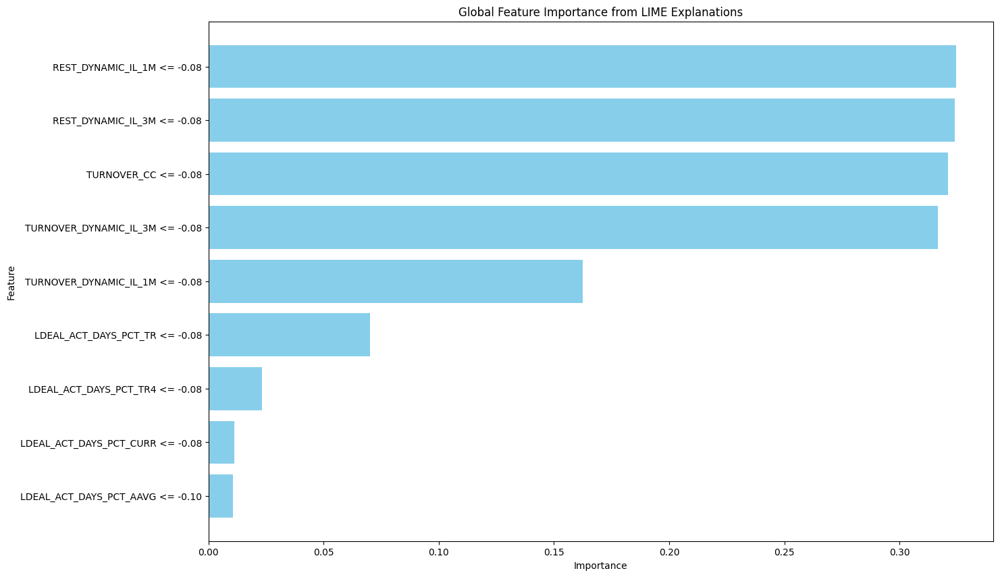

In [125]:
# Plotting the global feature importances

plt.figure(figsize=(15, 10))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Global Feature Importance from LIME Explanations')
plt.gca().invert_yaxis()
plt.show()

#**Saving the model**

In [126]:
'''
import pickle
filename_LR = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/LR_model_final.pkl'
filename_SVM = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/SVM_model_final.pkl'
pickle.dump(svm, open(filename_LR, 'wb'))
pickle.dump(svm, open(filename_SVM, 'wb'))
'''

"\nimport pickle\nfilename_LR = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/LR_model_final.pkl'\nfilename_SVM = '/content/drive/MyDrive/Colab Notebooks/Loyalist/Machine_learning_Projects_Assignments/Week11_group_assignment2/SVM_model_final.pkl'\npickle.dump(svm, open(filename_LR, 'wb'))\npickle.dump(svm, open(filename_SVM, 'wb'))\n"